# Pipeline for High-z Radio Galaxies 10: SHAP values for base models in prediction

In this notebook, we aim to obtain a SHAP analysis for a sub-sample of our catalogue in the base-learners used for predictions.  
It is possible to select either a random sample from the predicted pipeline (non-star, radio AGN) or high-redshift sources,  
regardless of their predicted values.

In [1]:
%matplotlib inline
# Static plots
#%matplotlib ipympl
# Interactive plots
import copy
import numpy as np
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as mpe
import sklearn.pipeline
from sklearn.model_selection import train_test_split
import colorcet as cc
import cmasher as cmr
from pycaret import classification as pyc
from pycaret import regression as pyr
from joblib import dump, load
import pandas as pd
import shap
import fasttreeshap
import global_variables as gv
import global_functions as gf

In [2]:
mpl.rcdefaults()

In [3]:
plt.rcParams['text.usetex'] = True

---

In [4]:
save_plot_flag      = False
load_models_flag    = True
use_zeroth_model    = False  # Initial model to discriminate between star and non-star objects
use_second_z_model  = False
use_calibration     = True
use_high_z_sources  = False  # If True, run on original high-z sources. False for running on random set of predicted non-star, rAGN.
use_unknown         = False  # False for using previously confirmed sources (AGN, Galaxies)

### Load data

Any of the available areas could be used. But we aim to Stripe 82 since we want to understand, with SHAP, predictions and not training.

In [5]:
used_area          = 'HETDEX'  # can be 'S82', 'HETDEX', 'COSMOS'
HETDEX_subset      = 'Validation'  # Validation, Training, Test, Test_Train (Validation corresponds to final testing set)
if not use_high_z_sources:
    if used_area == 'HETDEX':
        subset_str = f'_{HETDEX_subset}'
    if used_area != 'HETDEX':
        subset_str = ''
elif use_high_z_sources:
    subset_str     = ''

In [6]:
file_name_dict      = {'S82': gv.file_S82, 'HETDEX': gv.file_HETDEX, 'COSMOS': gv.file_COSMOS}
file_name           = file_name_dict[used_area]

In [7]:
model_cols = ['band_num', 'W4mag', 'g_r', 'r_i', 'r_J', 'i_z', 'i_y', 'z_y', 'z_W2', 'y_J',
              'y_W1', 'y_W2', 'J_H', 'H_K', 'H_W3', 'W1_W2', 'W1_W3', 'W3_W4', 'g_i', 'r_z',
              'z_W1', 'K_W3', 'K_W4', 'W2_W3', 'Kmag', 'g_W2', 'r_y', 'g_W1']

In [8]:
feats_2_disc_S82    = ['objID', 'RA_MILLI', 'DEC_MILLI', 'W1mag', 'W2mag', 'num_imputed', 'radio_detect']
feats_2_disc_HETDEX = ['objID', 'RA_MILLI', 'DEC_MILLI', 'W1mag', 'W2mag', 'num_imputed', 'radio_detect']
feats_2_disc_COSMOS = ['objID', 'RA_MILLI', 'DEC_MILLI', 'W1mag', 'W2mag', 'num_imputed', 'radio_detect']

feats_2_disc        = {'S82': feats_2_disc_S82, 'HETDEX': feats_2_disc_HETDEX, 'COSMOS': feats_2_disc_COSMOS}
features_2_discard  = feats_2_disc[used_area]

In [9]:
feats_2_select_S82    = ['is_AGN', 'is_gal', 'is_str', 'Z', 'zsp', 'LOFAR_detect', 'is_SDSS_QSO', 'is_SDSS_gal'] + model_cols
feats_2_select_HETDEX = ['is_AGN', 'is_gal', 'is_str', 'Z', 'zsp', 'LOFAR_detect', 'is_SDSS_QSO', 'is_SDSS_gal'] + model_cols
feats_2_select_COSMOS = ['is_AGN', 'is_gal', 'is_str', 'Z', 'zsp', 'LOFAR_detect', 'is_SDSS_QSO', 'is_SDSS_gal'] + model_cols

feats_2_select        = {'S82': feats_2_select_S82, 'HETDEX': feats_2_select_HETDEX, 'COSMOS': feats_2_select_COSMOS}
features_2_select     = feats_2_select[used_area]

In [10]:
# full_catalog_df     = pd.read_hdf(gv.cat_path + file_name, key='df').drop(columns=features_2_discard)
full_catalog_df     = pd.read_hdf(gv.cat_path + file_name, key='df').loc[:, features_2_select]
# full_catalog_df     = pd.read_hdf(gv.cat_path + file_name, key='df', colums=features_2_select)

In [11]:
if used_area == 'S82':
    full_catalog_df.loc[:, 'LOFAR_detect'] = full_catalog_df.loc[:, 'VLAS82_detect'].copy()
    full_catalog_df = full_catalog_df.drop(columns=['VLAS82_detect'])
if used_area == 'COSMOS':
    full_catalog_df.loc[:, 'LOFAR_detect'] = full_catalog_df.loc[:, 'COSMOSVLA3_detect'].copy()
    full_catalog_df = full_catalog_df.drop(columns=['COSMOSVLA3_detect'])

Create features with class and combined redshift.

In [12]:
full_catalog_df['class']            = full_catalog_df.loc[:, 'is_AGN'].copy()
if use_zeroth_model:
    filter_non_confirmed            = np.array(full_catalog_df.loc[:, 'is_AGN'] == 1) |\
                                      np.array(full_catalog_df.loc[:, 'is_gal'] == 1) |\
                                      np.array(full_catalog_df.loc[:, 'is_str'] == 1)
    full_catalog_df.loc[np.array(full_catalog_df.loc[:, 'is_str'] == 1), 'class'] = 2
elif not use_zeroth_model:
    filter_non_confirmed            = np.array(full_catalog_df.loc[:, 'is_AGN'] == 1) |\
                                      np.array(full_catalog_df.loc[:, 'is_gal'] == 1)
full_catalog_df.loc[~filter_non_confirmed, 'class'] = 0.5
idx_non_Z                           = full_catalog_df.loc[:, 'Z'].where(full_catalog_df.loc[:, 'Z'] > 0).isna()
full_catalog_df.loc[idx_non_Z, 'Z'] = full_catalog_df.loc[:, 'Z'].mask(idx_non_Z, full_catalog_df.loc[idx_non_Z, 'zsp'])

In [13]:
full_catalog_df['radio_AGN']        = np.array(full_catalog_df.loc[:, 'is_AGN'] == 1) & np.array(full_catalog_df.loc[:, 'LOFAR_detect'] == 1)

#### Select relevant sources

In [14]:
if use_high_z_sources:  # Only use high-z AGN
    # filter_selection   = np.array(full_catalog_df.loc[:, 'Z'] >= gv.high_z_limit)
    filter_selection   = np.array(full_catalog_df.loc[:, 'Z'] >= 4.0) & np.array(full_catalog_df.loc[:, 'class'] == 1)
    full_catalog_df    = full_catalog_df.loc[filter_selection]
    high_z_str         = '_high_z'
if not use_high_z_sources:
    high_z_str         = ''

In [15]:
if not use_high_z_sources:
    if used_area == 'HETDEX':
        if use_zeroth_model:
            filter_known_spec = (full_catalog_df.loc[:, 'is_AGN'] == 1) |\
                (full_catalog_df.loc[:, 'is_gal'] == 1) | (full_catalog_df.loc[:, 'is_str'] == 1)
        elif not use_zeroth_model:
            filter_known_spec = (full_catalog_df.loc[:, 'is_AGN'] == 1) | (full_catalog_df.loc[:, 'is_gal'] == 1)
        unknown_cat_df    = full_catalog_df.loc[~filter_known_spec]
        full_catalog_df   = full_catalog_df.loc[filter_known_spec]
        train_test_df, train_df, test_df, calibration_df, validation_df = gf.split_set(full_catalog_df, [0.2, 0.2, 0.5],\
                                                                                   'is_AGN', use_calibration=use_calibration)
        print('Shape of used data in HETDEX')
        print('-' * 65)
        print(f'Full confirmed dataset size:                      {full_catalog_df.shape}')
        print(f'Data for Modeling (Train, Test, and Calibration): {train_test_df.shape}')
        print(f'Training data:                                    {train_df.shape}')
        print(f'Testing data:                                     {test_df.shape}')
        if use_calibration:
            print(f'Calibration data:                                 {calibration_df.shape}')
        print(f'Validation data:                                  {validation_df.shape}')
        print('-' * 65)
        print()
        print(f'Using {HETDEX_subset} data from HETDEX')
        selected_dataset = {'Training': train_df, 'Test': test_df, 'Test_Train': train_test_df,\
                            'Validation': validation_df, 'Calibration': calibration_df}
        full_catalog_df = selected_dataset[HETDEX_subset]

Shape of used data in HETDEX
-----------------------------------------------------------------
Full confirmed dataset size:                      (118734, 38)
Data for Modeling (Train, Test, and Calibration): (94987, 38)
Training data:                                    (75989, 38)
Testing data:                                     (9499, 38)
Calibration data:                                 (9499, 38)
Validation data:                                  (23747, 38)
-----------------------------------------------------------------

Using Validation data from HETDEX


In [16]:
if not use_high_z_sources:
    if used_area != 'HETDEX':
        filter_confirmed = (full_catalog_df.loc[:, 'class'] == 0) |\
                           (full_catalog_df.loc[:, 'class'] == 1) |\
                           (full_catalog_df.loc[:, 'class'] == 2)  # Galaxy, AGN, star
        unknown_cat_df   = full_catalog_df.loc[~filter_confirmed]
        full_catalog_df  = full_catalog_df.loc[filter_confirmed]

In [17]:
full_catalog_df          = full_catalog_df.drop(columns=['is_AGN', 'is_SDSS_gal', 'is_gal', 'zsp'])

In [18]:
if not use_high_z_sources:
    if use_unknown:
        full_catalog_df = unknown_cat_df
    filter_selection   = np.ones_like(full_catalog_df.loc[:, 'class']).astype(bool)

In [19]:
print(f'Full used dataset size:              {full_catalog_df.shape}')
print('-' * 50)
print(f'Thus, it has {full_catalog_df.shape[0]:,} sources and {full_catalog_df.shape[1]:,} features.')
print(f'From the total, {np.sum(full_catalog_df.loc[:, "class"] == 1)} are confirmed AGN.')
print(f'From the total, {np.sum(full_catalog_df.loc[:, "class"] == 0)} are confirmed SFG.')
print(f'From the total, {np.sum(full_catalog_df.loc[:, "LOFAR_detect"] == 1)} have radio (LOFAR-like) detection.')
print(f'From the {np.sum(full_catalog_df.loc[:, "class"] == 1)} AGN,\
 {np.sum((full_catalog_df.loc[:, "class"] == 1) & (full_catalog_df.loc[:, "LOFAR_detect"] == 1))} have radio (LOFAR-like) detection.')
print(f'From the {np.sum(full_catalog_df.loc[:, "class"] == 0)} SFG,\
 {np.sum((full_catalog_df.loc[:, "class"] == 0) & (full_catalog_df.loc[:, "LOFAR_detect"] == 1))} have radio (LOFAR-like) detection.')

Full used dataset size:              (23747, 34)
--------------------------------------------------
Thus, it has 23,747 sources and 34 features.
From the total, 10108 are confirmed AGN.
From the total, 13639 are confirmed SFG.
From the total, 3668 have radio (LOFAR-like) detection.
From the 10108 AGN, 1664 have radio (LOFAR-like) detection.
From the 13639 SFG, 2004 have radio (LOFAR-like) detection.


### Load models

In [20]:
if load_models_flag:
    if use_zeroth_model:
        star_clf          = pyc.load_model(gv.models_path + gv.star_model)  # star/no-star model
        cal_star_clf      = load(gv.models_path + gv.cal_str_model)  # calibrated model
    AGN_SFG_clf           = pyc.load_model(gv.models_path + gv.AGN_gal_model)  #  AGN/galaxy
    cal_AGN_SFG_clf       = load(gv.models_path + gv.cal_AGN_gal_model)  # AGN/galaxy calibrated model
    # radio_det_clf         = pyc.load_model(gv.models_path + gv.radio_model)  # Radio detection for AGN
    # cal_radio_det_clf     = load(gv.models_path + gv.cal_radio_model)  # calibrated model radio detection for AGN
    # redshift_reg          = pyr.load_model(gv.models_path + gv.full_z_model)  # to use on full sample

    radio_det_AGN_clf     = pyc.load_model(gv.models_path + gv.radio_model)  # Radio detection for AGN
    cal_radio_det_AGN_clf = load(gv.models_path + gv.cal_radio_model)  # calibrated model radio detection for AGN
    
    radio_det_SFG_clf     = pyc.load_model(gv.models_path + gv.radio_galaxies_model)  # Radio detection for galaxies
    cal_radio_det_SFG_clf = load(gv.models_path + gv.cal_radio_gals_model)  # calibrated model radio detection for galaxie
    
    redshift_reg_rAGN     = pyr.load_model(gv.models_path + gv.full_z_model)  # Redshift prediction for radio-AGN
    redshift_reg_rSFG     = pyr.load_model(gv.models_path + gv.z_radio_galaxies_model)  # Redshift prediction for radio-galaxies

Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded


In [21]:
if use_zeroth_model:
    threshold_star_logit = np.log(gv.star_thresh  / (1 - gv.star_thresh))
threshold_AGN_logit      = np.log(gv.AGN_thresh   / (1 - gv.AGN_thresh))
threshold_radio_AGN_logit = np.log(gv.radio_thresh / (1 - gv.radio_thresh))
threshold_radio_SFG_logit = np.log(gv.radio_gals_thresh / (1 - gv.radio_gals_thresh))

#### Predictions

In [22]:
if use_zeroth_model:  # we want no-star sources => label == 0
    full_catalog_df = pyc.predict_model(star_clf, data=full_catalog_df, probability_threshold=gv.star_thresh, raw_score=True, round=10)
    full_catalog_df = full_catalog_df.drop(columns=['Score_1'])
    full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_star', 'Score_0': 'Score_no_star'})
    full_catalog_df.loc[:, 'Score_no_star'] = np.around(full_catalog_df.loc[:, 'Score_no_star'], decimals=7)
elif not use_zeroth_model:
    full_catalog_df['pred_star']     = 0
    full_catalog_df['Score_no_star'] = 1

In [23]:
# full_catalog_df = pyc.predict_model(AGN_SFG_clf, data=full_catalog_df, probability_threshold=gv.AGN_thresh, raw_score=True, round=10)
# full_catalog_df = full_catalog_df.drop(columns=['Score_0'])
# full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_class', 'Score_1': 'Score_AGN'})
# full_catalog_df.loc[:, 'Score_AGN'] = np.around(full_catalog_df.loc[:, 'Score_AGN'], decimals=6)
# 
# pred_probs      = cal_AGN_SFG_clf.predict(full_catalog_df.loc[:, 'Score_AGN'])
# cal_class       = np.array(pred_probs >= gv.cal_AGN_thresh).astype(int)
# full_catalog_df['Prob_AGN']       = pred_probs
# full_catalog_df['pred_class_cal'] = cal_class

In [24]:
# full_catalog_df = pyc.predict_model(radio_det_AGN_clf, data=full_catalog_df, probability_threshold=gv.radio_thresh, raw_score=True, round=10)
# full_catalog_df = full_catalog_df.drop(columns=['Score_0'])
# full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_radio_AGN', 'Score_1': 'Score_radio_AGN'})
# full_catalog_df.loc[:, 'Score_radio_AGN'] = np.around(full_catalog_df.loc[:, 'Score_radio_AGN'], decimals=6)
# 
# pred_probs      = cal_radio_det_AGN_clf.predict(full_catalog_df.loc[:, 'Score_radio_AGN'])
# cal_class       = np.array(pred_probs >= gv.cal_radio_thresh).astype(int)
# full_catalog_df['Prob_radio_AGN']     = pred_probs
# full_catalog_df['pred_radio_AGN_cal'] = cal_class

In [25]:
# full_catalog_df = pyc.predict_model(radio_det_SFG_clf, data=full_catalog_df, probability_threshold=gv.radio_gals_thresh, raw_score=True, round=10)
# full_catalog_df = full_catalog_df.drop(columns=['Score_0'])
# full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_radio_SFG', 'Score_1': 'Score_radio_SFG'})
# full_catalog_df.loc[:, 'Score_radio_SFG'] = np.around(full_catalog_df.loc[:, 'Score_radio_SFG'], decimals=6)
# 
# pred_probs      = cal_radio_det_SFG_clf.predict(full_catalog_df.loc[:, 'Score_radio_SFG'])
# cal_class       = np.array(pred_probs >= gv.cal_radio_gals_thresh).astype(int)
# full_catalog_df['Prob_radio_SFG']     = pred_probs
# full_catalog_df['pred_radio_SFG_cal'] = cal_class

In [26]:
# full_catalog_df = pyr.predict_model(redshift_reg_rAGN, data=full_catalog_df, round=8)
# full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_Z_rAGN'})
# full_catalog_df.loc[:, 'pred_Z_rAGN'] = np.around(full_catalog_df.loc[:, 'pred_Z_rAGN'], decimals=4)

In [27]:
# full_catalog_df = pyr.predict_model(redshift_reg_rSFG, data=full_catalog_df, round=8)
# full_catalog_df = full_catalog_df.rename(columns={'Label': 'pred_Z_rSFG'})
# full_catalog_df.loc[:, 'pred_Z_rSFG'] = np.around(full_catalog_df.loc[:, 'pred_Z_rSFG'], decimals=4)

In [28]:
full_catalog_df = gf.predict_AGN_gal(full_catalog_df, AGN_SFG_clf,  cal_AGN_SFG_clf,
                                      gv.AGN_thresh, gv.cal_AGN_thresh, raw_score=True)

In [29]:
full_catalog_df = gf.predict_radio_det(full_catalog_df, radio_det_AGN_clf, cal_radio_det_AGN_clf,
                                       gv.radio_thresh, gv.cal_radio_thresh, raw_score=True,
                                       cols_out=['pred_radio_AGN', 'Score_radio_AGN', 'Prob_radio_AGN', 'pred_radio_AGN_cal'])

In [30]:
full_catalog_df = gf.predict_radio_det(full_catalog_df, radio_det_SFG_clf, cal_radio_det_SFG_clf,
                                        gv.radio_gals_thresh, gv.cal_radio_gals_thresh, raw_score=True,
                                       cols_out=['pred_radio_SFG', 'Score_radio_SFG', 'Prob_radio_SFG', 'pred_radio_SFG_cal'])

In [31]:
full_catalog_df = gf.predict_z(full_catalog_df, redshift_reg_rAGN, cols_out=['pred_Z_rAGN'])

In [32]:
full_catalog_df = gf.predict_z(full_catalog_df, redshift_reg_rSFG, cols_out=['pred_Z_rSFG'])

In [33]:
full_catalog_df['pred_radio_AGN'] = np.array(full_catalog_df.loc[:, 'pred_star'] == 0) &\
                                    np.array(full_catalog_df.loc[:, 'pred_class'] == 1) &\
                                    np.array(full_catalog_df.loc[:, 'pred_radio_AGN'] == 1)

In [34]:
full_catalog_df['pred_radio_SFG'] = np.array(full_catalog_df.loc[:, 'pred_star'] == 0) &\
                                    np.array(full_catalog_df.loc[:, 'pred_class'] == 0) &\
                                    np.array(full_catalog_df.loc[:, 'pred_radio_SFG'] == 1)

Now, select sources predicted (from calibrated models) to be rAGN and/or rSFG (depending on model to study)

In [35]:
full_catalog_df.columns.values

array(['is_str', 'Z', 'LOFAR_detect', 'is_SDSS_QSO', 'band_num', 'W4mag',
       'g_r', 'r_i', 'r_J', 'i_z', 'i_y', 'z_y', 'z_W2', 'y_J', 'y_W1',
       'y_W2', 'J_H', 'H_K', 'H_W3', 'W1_W2', 'W1_W3', 'W3_W4', 'g_i',
       'r_z', 'z_W1', 'K_W3', 'K_W4', 'W2_W3', 'Kmag', 'g_W2', 'r_y',
       'g_W1', 'class', 'radio_AGN', 'pred_star', 'Score_no_star',
       'pred_class', 'Score_AGN', 'Prob_AGN', 'pred_class_cal',
       'pred_radio_AGN', 'Score_radio_AGN', 'Prob_radio_AGN',
       'pred_radio_AGN_cal', 'pred_radio_SFG', 'Score_radio_SFG',
       'Prob_radio_SFG', 'pred_radio_SFG_cal', 'pred_Z_rAGN',
       'pred_Z_rSFG'], dtype=object)

In [36]:
filter_pred_AGN  = np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 1)
filter_pred_SFG  = np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 0)

In [37]:
filter_pred_rAGN = np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 1) &\
                   np.array(full_catalog_df.loc[:, 'pred_radio_AGN_cal'] == 1)
filter_pred_rSFG = np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 0) &\
                   np.array(full_catalog_df.loc[:, 'pred_radio_SFG_cal'] == 1)

In [38]:
filter_pred_known = filter_pred_AGN | filter_pred_SFG
filter_pred_radio = filter_pred_rAGN | filter_pred_rSFG

In [39]:
def find_best_threshold(y_true, y_probs, beta=1.0):
    from sklearn.metrics import fbeta_score
    thresholds     = np.linspace(0, 1, 1001)  # Try thresholds from 0.0 to 1.0
    best_threshold = 0.5
    best_score     = 0.0

    for t in thresholds:
        y_pred = (y_probs >= t).astype(int)
        score  = fbeta_score(y_true, y_pred, beta=beta)
        if score > best_score:
            best_score = score
            best_threshold = t

    return best_threshold, best_score

In [40]:
full_catalog_df = full_catalog_df.loc[filter_pred_known]

In [41]:
np.sum(filter_pred_rAGN)

1783

In [42]:
np.sum(filter_pred_rSFG)

2005

In [43]:
np.sum(filter_pred_radio)

3788

Separate samples for each application of SHAP

In [44]:
data_AGN       = full_catalog_df.loc[np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 1)]
data_SFG       = full_catalog_df.loc[np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 0)]
data_radio_AGN = full_catalog_df.loc[np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 1) &\
                                     np.array(full_catalog_df.loc[:, 'pred_radio_AGN_cal'] == 1)]
data_radio_SFG = full_catalog_df.loc[np.array(full_catalog_df.loc[:, 'pred_class_cal'] == 0) &\
                                     np.array(full_catalog_df.loc[:, 'pred_radio_SFG_cal'] == 1)]

In [45]:
print(np.shape(full_catalog_df))
print(np.shape(data_AGN))
print(np.shape(data_SFG))
print(np.shape(data_radio_AGN))
print(np.shape(data_radio_SFG))

(23747, 50)
(10292, 50)
(13455, 50)
(1783, 50)
(2005, 50)


---

## Use SHAP

Flags to run on sub-set of base learners.

In [46]:
run_shap_AGN_base    = True
run_shap_radio_base  = True
run_shap_z_base      = True
run_shap_high_z_base = True

In [47]:
if use_zeroth_model:
    filter_pred_no_str = np.array(full_catalog_df.loc[:, 'pred_star'] == 0)
elif not use_zeroth_model:
    filter_pred_no_str = np.ones_like(full_catalog_df.loc[:, 'class']).astype(bool)

#### SHAP - AGN/SFG model

In [48]:
if run_shap_AGN_base:
    model_name_AGN = type(AGN_SFG_clf.named_steps['trained_model'].final_estimator_).__name__.replace('Classifier', '')

SHAP does not need to use the full dataset for its analysis. Around $N=1000$ (or less) is a good number.

In [49]:
if run_shap_AGN_base:
    base_sample_size_AGN = 25000
    sample_size_AGN = np.nanmin([np.shape(full_catalog_df)[0], base_sample_size_AGN])
    print(f'Number of selected elements: {sample_size_AGN:,}')

Number of selected elements: 23,747


In [50]:
if run_shap_AGN_base:
    base_models_names_AGN = gf.get_base_estimators_names(AGN_SFG_clf)

In [51]:
if run_shap_AGN_base:
    reduced_data_AGN    = full_catalog_df.sample(n=sample_size_AGN, random_state=gv.seed).copy()
    display(reduced_data_AGN.loc[:, ['class', 'pred_class_cal']].describe())
    reduced_data_AGN_df = gf.preprocess_data(AGN_SFG_clf, reduced_data_AGN, base_models_names_AGN)
    reduced_cols_AGN    = reduced_data_AGN_df.columns.drop(base_models_names_AGN)

,class,pred_class_cal
count,23747.000000,23747.000000
mean,0.425654,0.433402
std,0.494452,0.495555
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,1.000000,1.000000
max,1.000000,1.000000


Use FastTreeSHAP package

In [52]:
if run_shap_AGN_base:
    explainers_AGN_base = {}
    for model, model_fit in zip(AGN_SFG_clf.named_steps['trained_model'].estimators, AGN_SFG_clf.named_steps['trained_model'].estimators_):
        explainers_AGN_base[model[0]] = fasttreeshap.TreeExplainer(model_fit, data=None, feature_perturbation='tree_path_dependent',
                                                                   model_output='raw', feature_dependence='independent', algorithm='auto',
                                                                   n_jobs=12)  # No data

In [53]:
if run_shap_AGN_base:
    shap_values_AGN_base  = {}
    for model in explainers_AGN_base.keys():
        print(f'Working with base model {model}')
        shap_values_AGN_base[model] = explainers_AGN_base[model](reduced_data_AGN_df.drop(columns=base_models_names_AGN), check_additivity=False)

Working with base model xgboost
Working with base model rf
Working with base model et
Working with base model gbc


In [54]:
if run_shap_AGN_base:
    print('Expected "logit" values per base model')
    print('-' * 30)
    for model in explainers_AGN_base.keys():
        expected_value = np.array([explainers_AGN_base[model].expected_value]).flatten()[-1]
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            print(f'{model: <10}\t: {np.exp(expected_value) / (1 + np.exp(expected_value)): .4f}')
        else:
            print(f'{model: <10}\t: {expected_value: .4f}')

Expected "logit" values per base model
------------------------------
xgboost   	:  0.3623
rf        	:  0.4260
et        	:  0.4256
gbc       	:  0.3240


In [55]:
colour_hex_SFG = '#1E88E5'
colour_hex_AGN = '#D32F2F'

colour_rSFG = mcolors.to_rgba(colour_hex_SFG)
colour_rAGN = mcolors.to_rgba(colour_hex_AGN)
colour_rSFG_shade = gf.create_shaded_colour(colour_hex_SFG)
colour_rAGN_shade = gf.create_shaded_colour(colour_hex_AGN)
colour_rSFG_rgb_darker, colour_rSFG_rgb_bright = gf.create_darker_brighter_rgb(colour_hex_SFG)
colour_rAGN_rgb_darker, colour_rAGN_rgb_bright = gf.create_darker_brighter_rgb(colour_hex_AGN)

cm_gradient_rAGN = mcolors.LinearSegmentedColormap.from_list('gradient_rAGN', [colour_rAGN_rgb_darker, colour_rAGN_rgb_bright], N=50)
cm_gradient_rSFG = mcolors.LinearSegmentedColormap.from_list('gradient_rGal', [colour_rSFG_rgb_darker, colour_rSFG_rgb_bright], N=50)
cm_gradient = {'rAGN': cm_gradient_rAGN, 'rSFG': cm_gradient_rSFG}

cm_gradient_AGN = gf.create_colour_gradient(colour_hex_AGN)
cm_gradient_SFG = gf.create_colour_gradient(colour_hex_SFG)
cm_grad_AGN_whi = gf.create_colour_gradient_to_white(colour_hex_AGN)
cm_grad_SFG_whi = gf.create_colour_gradient_to_white(colour_hex_SFG)

In [56]:
# Now you can combine the white gradients:
combined_cmap_white = gf.combine_colormaps(cm_grad_SFG_whi.reversed(), cm_grad_AGN_whi)

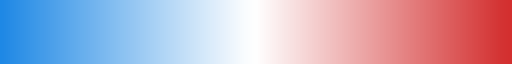

In [57]:
combined_cmap_white

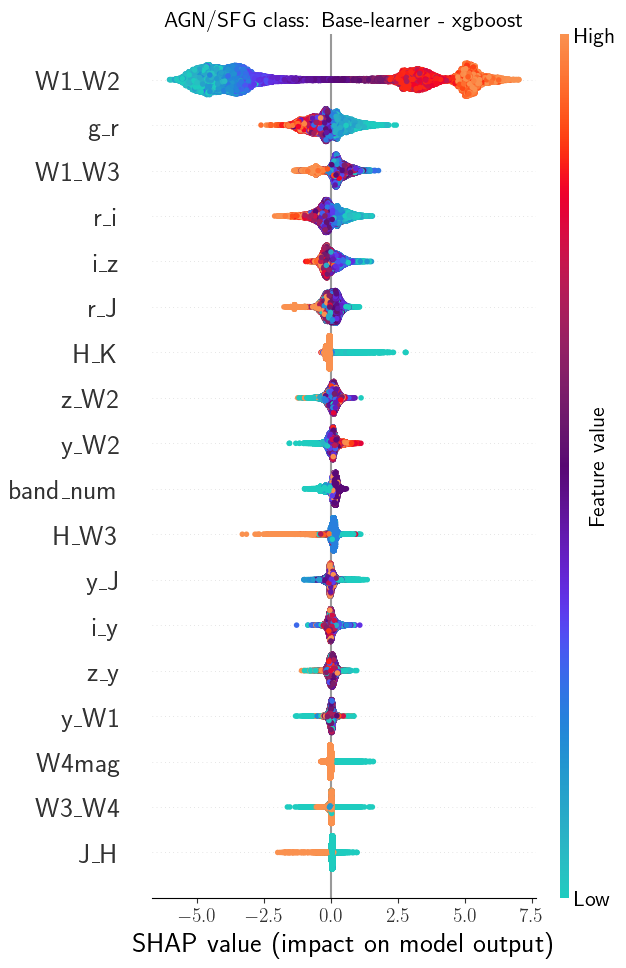

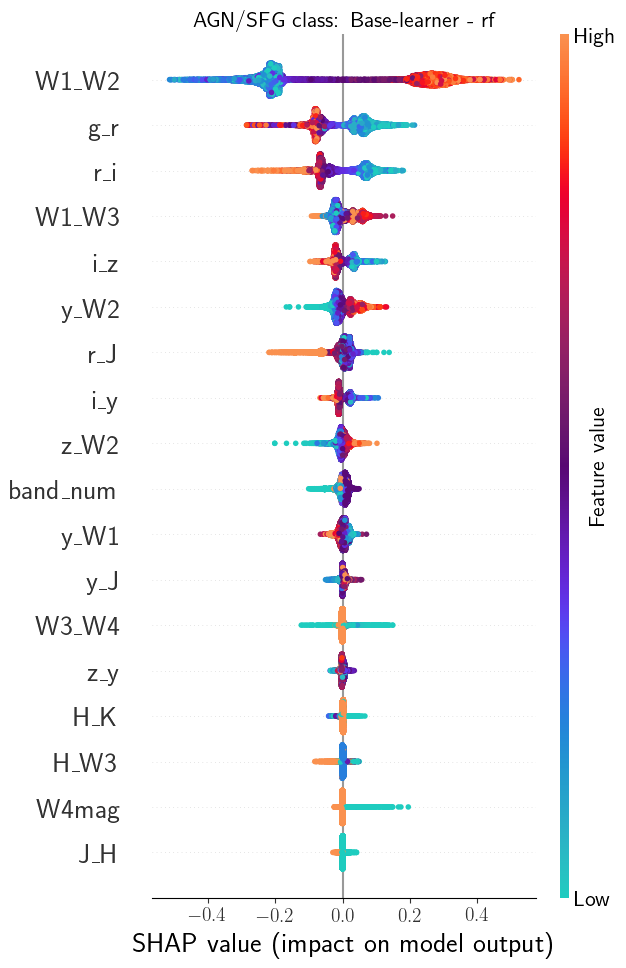

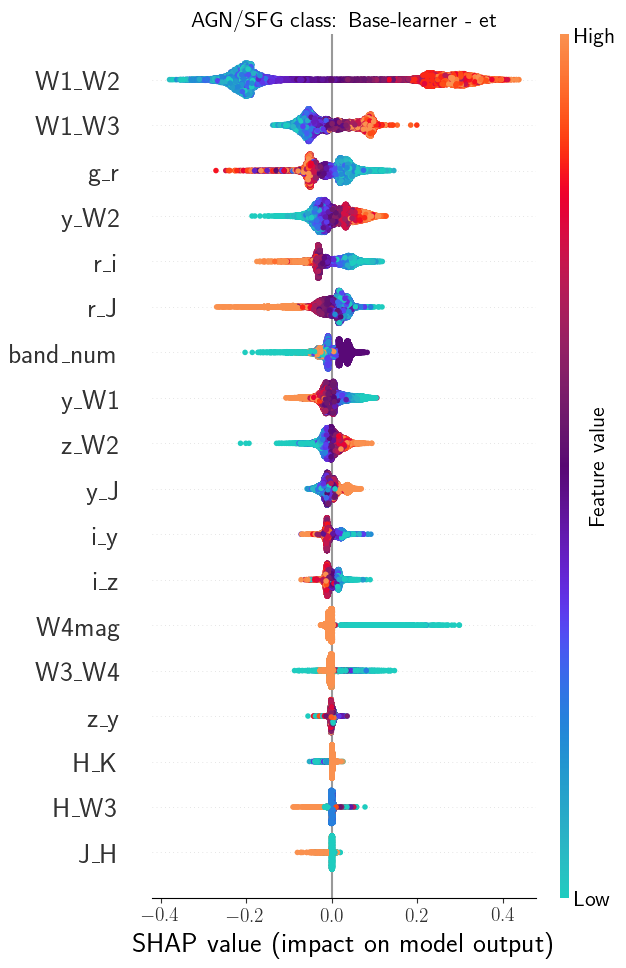

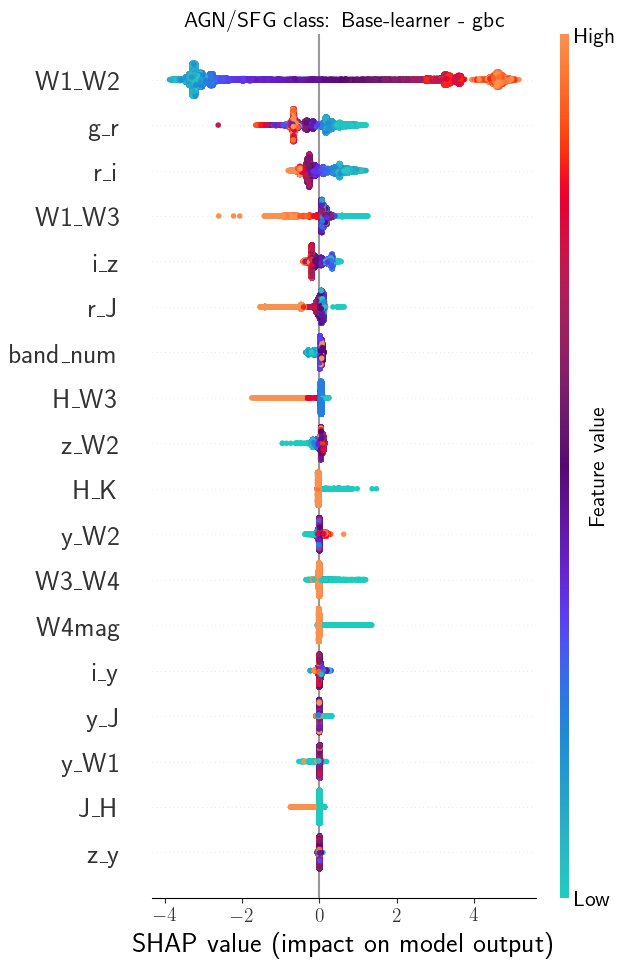

In [58]:
if run_shap_AGN_base:
    for model in shap_values_AGN_base.keys():
        gf.plot_shap_beeswarm('AGN/SFG class', model, shap_values_AGN_base[model], base_meta='Base')
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [59]:
# new_base_logit_AGN = np.log(gv.cal_AGN_thresh / (1 - gv.cal_AGN_thresh))
new_base_logit_AGN = np.log(0.5 / (1 - 0.5))

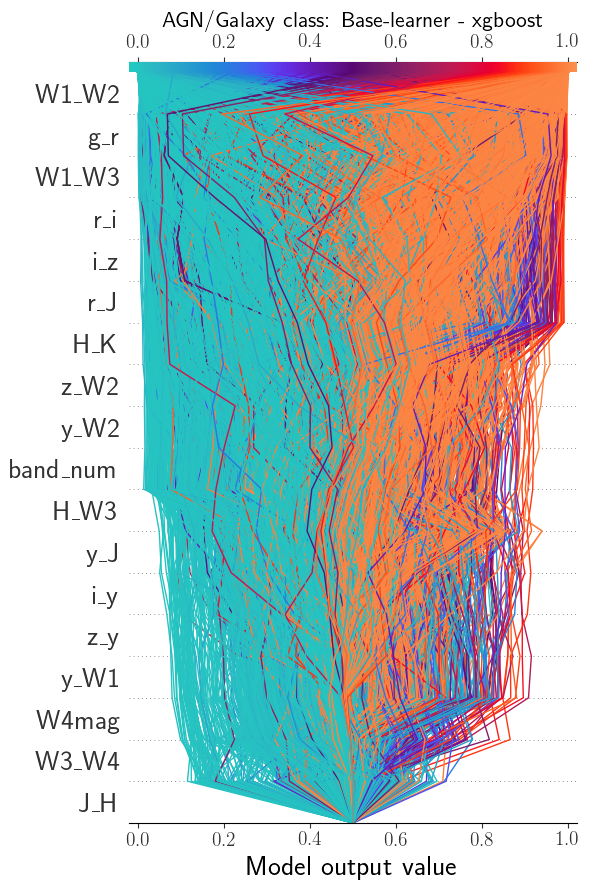

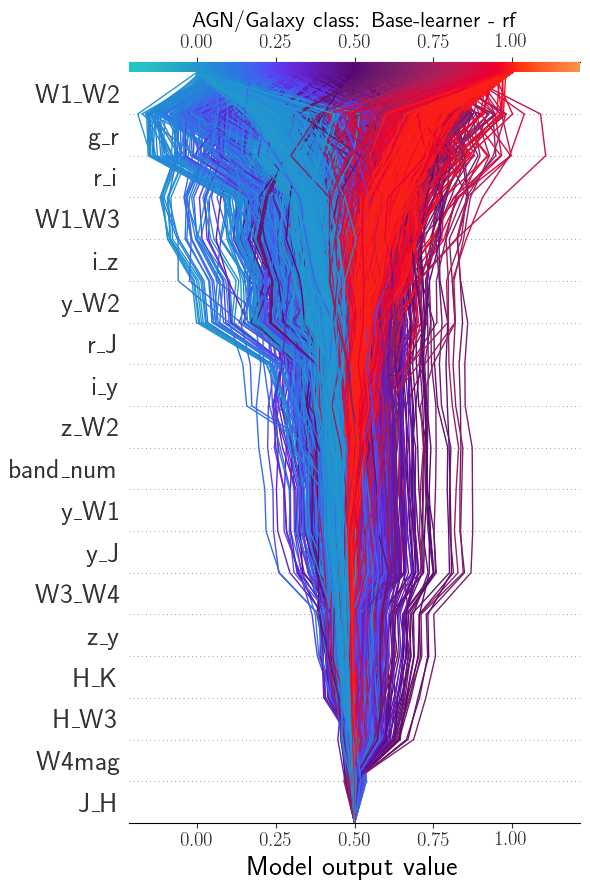

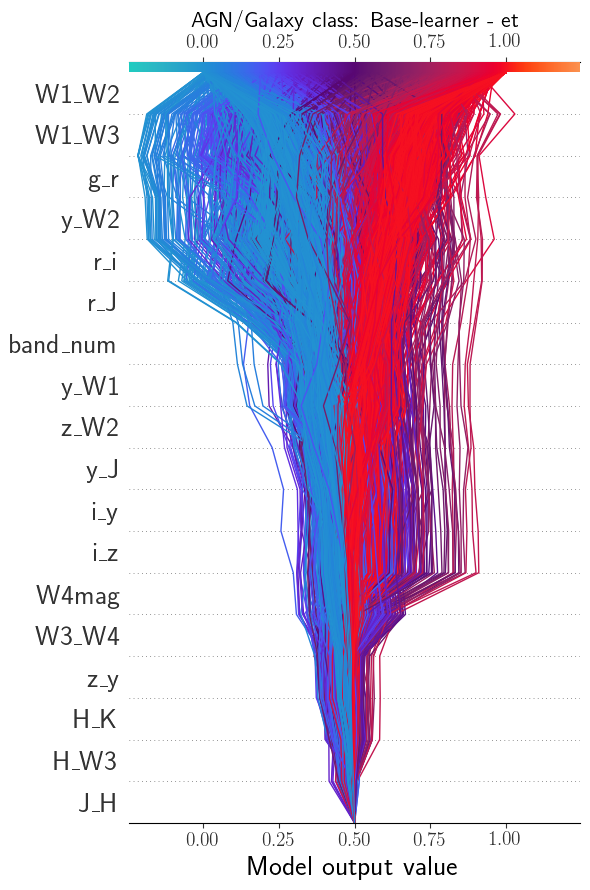

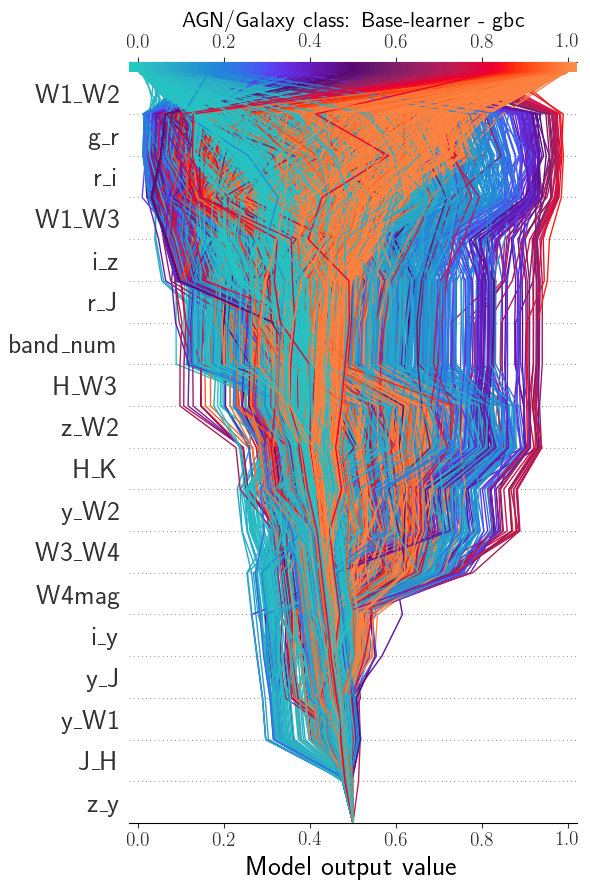

In [60]:
if run_shap_AGN_base:
    for model in shap_values_AGN_base.keys():
        size_side        = 6
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            logit_mode   = 'logit'
            new_base_AGN = new_base_logit_AGN
        else:
            logit_mode   = 'identity'
            # new_base_AGN = gv.cal_AGN_thresh
            new_base_AGN = 0.5
        fig              = plt.figure(figsize=(size_side, size_side * 3/2))
        ax1              = fig.add_subplot(111, xscale='linear', yscale='linear')
        _ = gf.plot_shap_decision('AGN/Galaxy class', model, shap_values_AGN_base[model],
                                  explainers_AGN_base[model], reduced_cols_AGN, ax1,
                                  logit_mode, new_base_value=new_base_AGN,
                                  base_meta='Base', ignore_warnings=True)
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_decision_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [61]:
if run_shap_AGN_base:
    sorted_mean_abs_SHAP_AGN = gf.mean_abs_SHAP_base_models(shap_values_AGN_base, list(shap_values_AGN_base.keys()))
    for key in shap_values_AGN_base.keys():
        sorted_mean_abs_SHAP_AGN[key].loc[:, 'Mean_abs_SHAP'] = sorted_mean_abs_SHAP_AGN[key].loc[:, 'Mean_abs_SHAP'] /\
                                                                sorted_mean_abs_SHAP_AGN[key].loc[:, 'Mean_abs_SHAP'].sum() * 100
    multicol_feat_AGN = [(key, name) for key in sorted_mean_abs_SHAP_AGN.keys() for name in ('Feature', 'Mean_abs_SHAP')]

In [62]:
if run_shap_AGN_base:
    sorted_mean_abs_SHAP_AGN_base_full_df = pd.concat([sorted_mean_abs_SHAP_AGN[key].reset_index(drop=True) for key in shap_values_AGN_base.keys()], axis=1)
    sorted_mean_abs_SHAP_AGN_base_full_df.columns = pd.MultiIndex.from_tuples(multicol_feat_AGN)
    print('Mean absolute SHAP values scaled to sum 100')
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_AGN_base_full_df)

Mean absolute SHAP values scaled to sum 100


xgboost                      rf                      et                \
     Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   
0      W1_W2        55.965     W1_W2        44.978     W1_W2        42.318   
1        g_r         7.665       g_r        13.074     W1_W3         9.864   
2      W1_W3         5.566       r_i        12.021       g_r         6.997   
3        r_i         5.499     W1_W3         5.082      y_W2         6.323   
4        i_z         3.287       i_z         4.495       r_i         6.137   
5        r_J         3.213      y_W2         4.374       r_J         5.200   
6        H_K         2.367       r_J         3.188  band_num         4.645   
7       z_W2         2.192       i_y         3.043      y_W1         3.944   
8       y_W2         2.182      z_W2         2.037      z_W2         3.051   
9   band_num         2.176  band_num         2.003       y_J         2.924   
10      H_W3         1.936      y_W1         1.818       i_y         2.523   
11       y_J         1.645       y_J         0.977       i_z         2.048   
12       i_y         1.546     W3_W4         0.698     W4mag         1.241   
13       z_y         1.459       z_y         0.654     W3_W4         1.045   
14      y_W1         1.077       H_K         0.479       z_y         0.604   
15     W4mag         0.794      H_W3         0.476       H_K         0.461   
16     W3_W4         0.766     W4mag         0.463      H_W3         0.456   
17       J_H         0.665       J_H         0.140       J_H         0.219   

         gbc                
     Feature Mean_abs_SHAP  
0      W1_W2        64.651  
1        g_r         8.949  
2        r_i         6.945  
3      W1_W3         4.619  
4        i_z         3.944  
5        r_J         2.044  
6   band_num         1.610  
7       H_W3         1.575  
8       z_W2         1.478  
9        H_K         0.946  
10      y_W2         0.945  
11     W3_W4         0.561  
12     W4mag         0.524  
13       i_y         0.487  
14       y_J         0.249  
15      y_W1         0.217  
16       J_H         0.153  
17       z_y         0.103

In [63]:
if run_shap_AGN_base:
    sorted_mean_abs_SHAP_AGN = pd.read_hdf(gv.tmp_shap_path + f'mean_abs_SHAP_AGN_meta_{used_area}{subset_str}{high_z_str}.h5', key='df')

In [64]:
if run_shap_AGN_base:
    print('Combined mean absolute SHAP values scaled to sum 100')
    sorted_mean_abs_SHAP_AGN_comb = sorted_mean_abs_SHAP_AGN.copy().set_index('Feature')
    for key in shap_values_AGN_base.keys():
        factor = sorted_mean_abs_SHAP_AGN.set_index('Feature').loc[key] / 100
        tmp_feat_imp = sorted_mean_abs_SHAP_AGN_base_full_df.loc[:, key].copy().set_index('Feature')
        sorted_mean_abs_SHAP_AGN_comb = sorted_mean_abs_SHAP_AGN_comb + tmp_feat_imp * factor
    sorted_mean_abs_SHAP_AGN_comb = sorted_mean_abs_SHAP_AGN_comb.sort_values(by=['Mean_abs_SHAP'],
                                                                              ascending=False).drop(index=list(shap_values_AGN_base.keys()))
    sorted_mean_abs_SHAP_AGN_comb['Cumulative_sum'] = sorted_mean_abs_SHAP_AGN_comb.loc[:, 'Mean_abs_SHAP'].cumsum()
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_AGN_comb)

Combined mean absolute SHAP values scaled to sum 100


,Mean_abs_SHAP,Cumulative_sum
Feature,,
W1_W2,51.851,51.851
g_r,8.855,60.706
r_i,7.857,68.562
W1_W3,6.445,75.008
r_J,3.845,78.852
y_W2,3.431,82.283
i_z,3.356,85.640
band_num,2.701,88.341
z_W2,2.085,90.425


xgboost


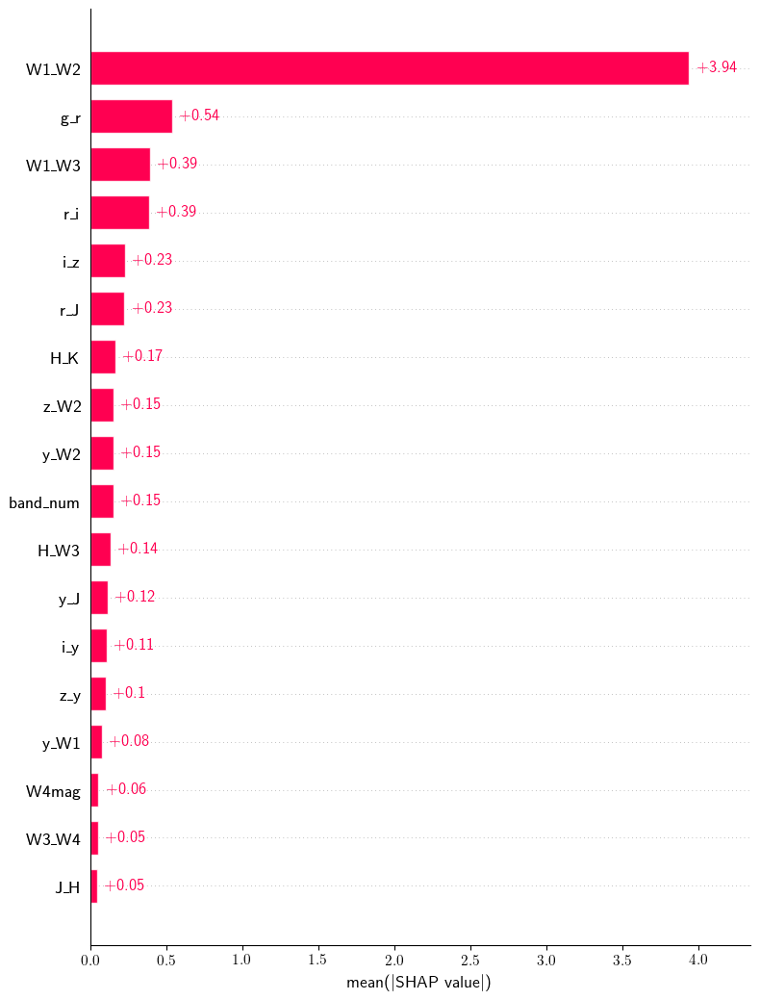

rf


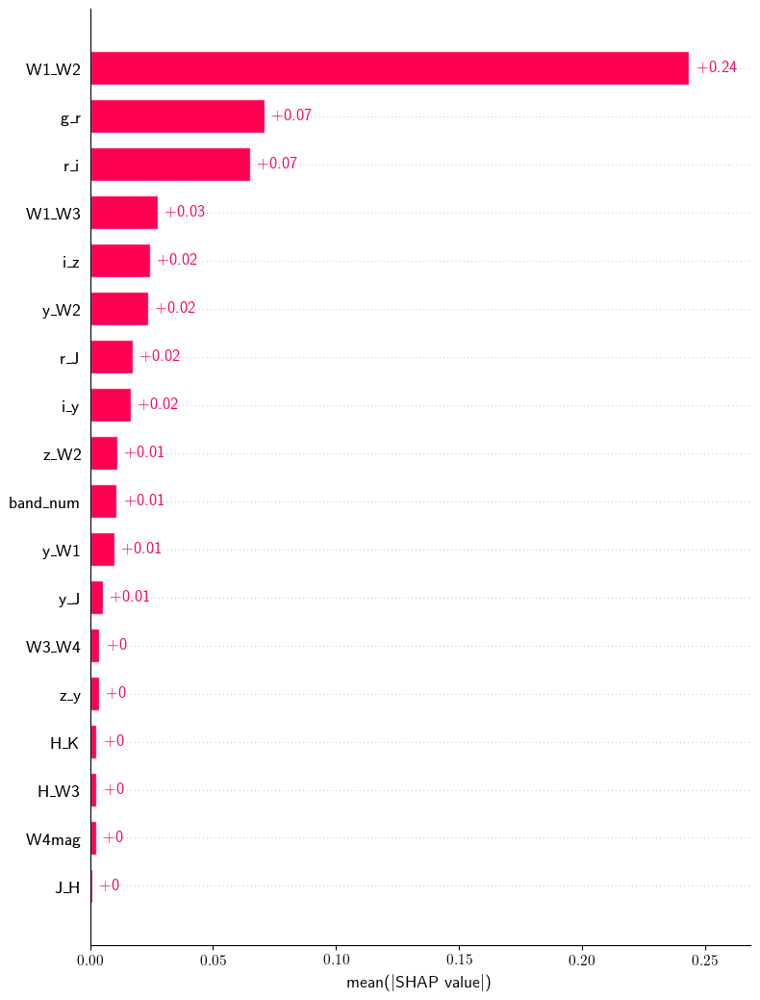

et


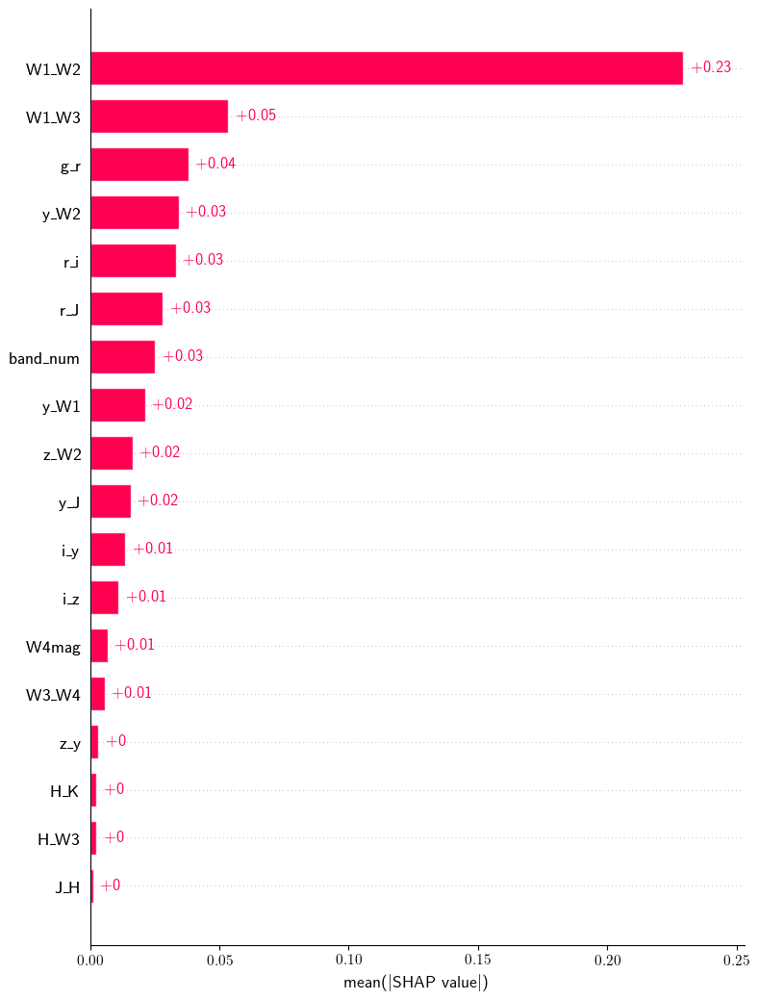

gbc


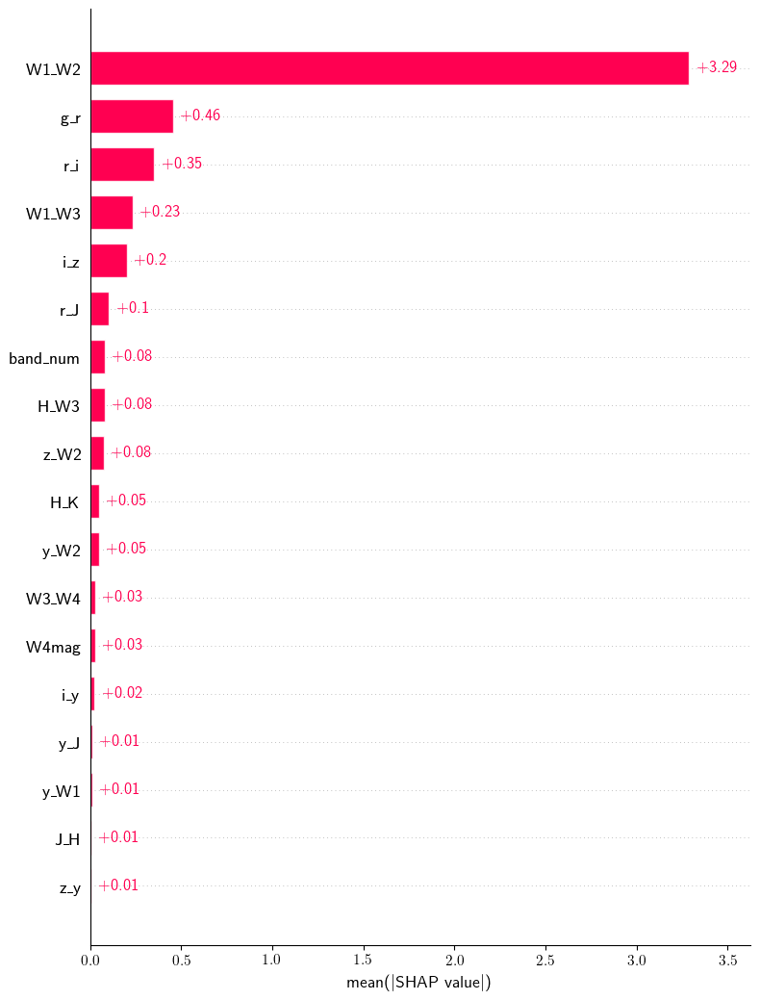

In [65]:
if run_shap_AGN_base:
    shp_copies_AGN = {}
    for model in shap_values_AGN_base.keys():
        # Convert from FastTreeShap to Shap object
        shp_copies_AGN[model] = shap.Explanation(values=shap_values_AGN_base[model].values,\
                                                 base_values=shap_values_AGN_base[model].base_values,\
                                                 data=shap_values_AGN_base[model].data,\
                                                 feature_names=shap_values_AGN_base[model].feature_names)
        print(f'{model}')
        if np.ndim(shp_copies_AGN[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_AGN[model], max_display=None, show=False)
        elif np.ndim(shp_copies_AGN[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_AGN[model][:, :, 1], max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

xgboost


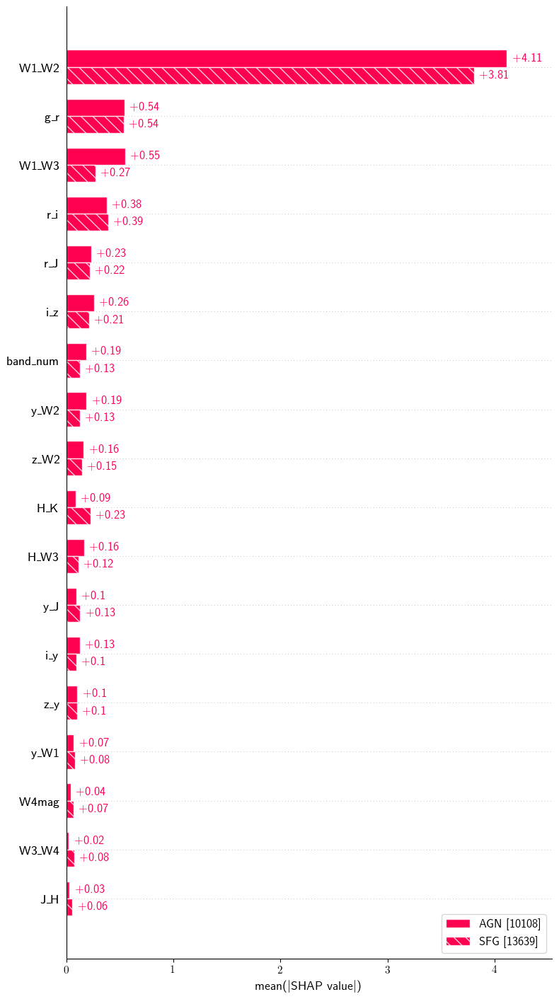

rf


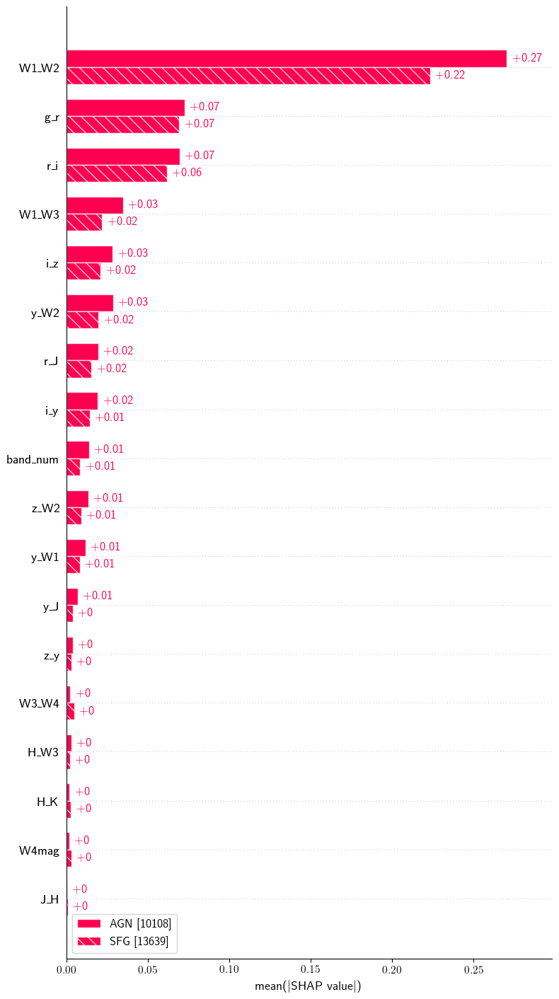

et


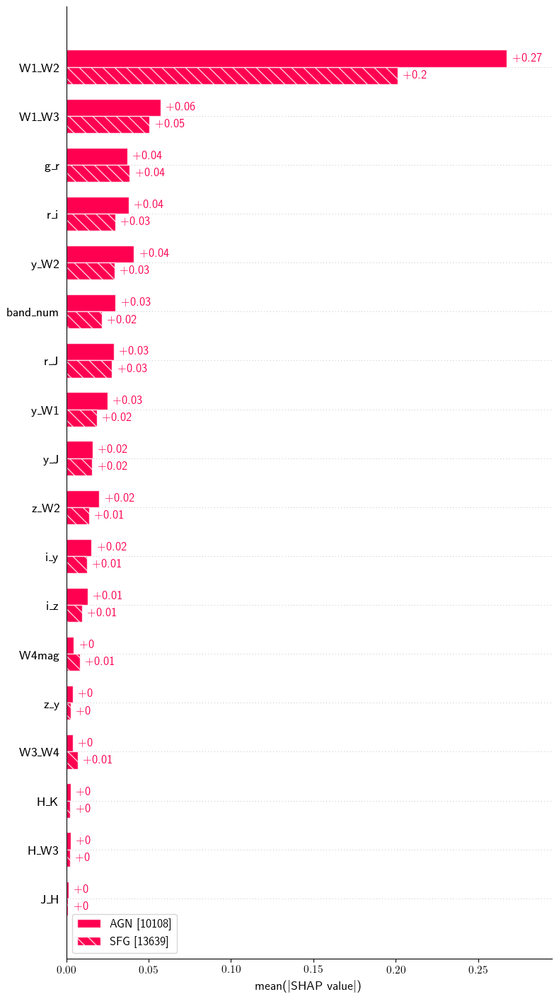

gbc


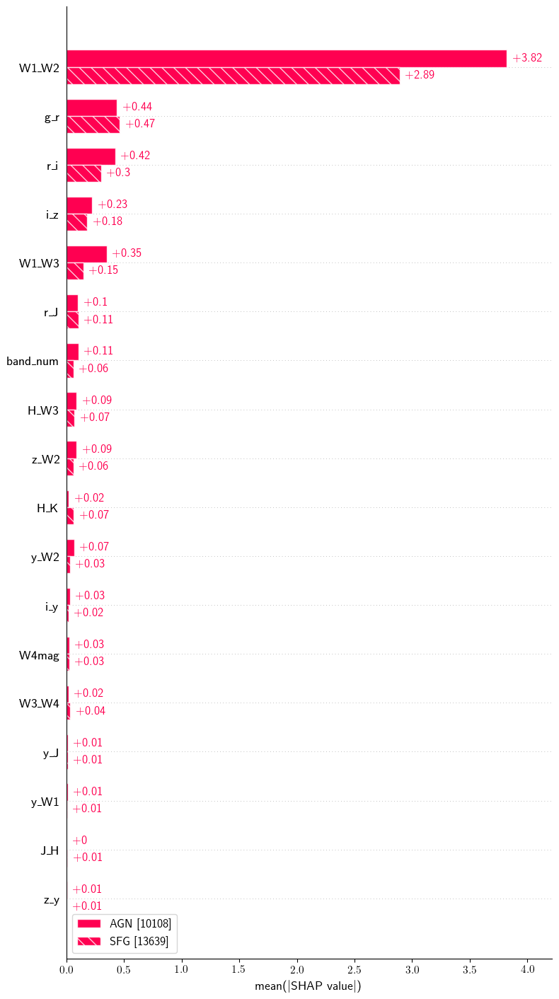

In [66]:
if run_shap_AGN_base:
    class_AGN_labels = ['SFG' if elem == 0 else 'AGN' for elem in reduced_data_AGN.loc[:, 'class']]
    for model in shap_values_AGN_base.keys():
        print(f'{model}')
        if np.ndim(shp_copies_AGN[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_AGN[model].cohorts(class_AGN_labels).abs.mean(0), max_display=None, show=False)
        elif np.ndim(shp_copies_AGN[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_AGN[model][:, :, 1].cohorts(class_AGN_labels).abs.mean(0), max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

In [67]:
if run_shap_AGN_base:
    for count, model in enumerate(shap_values_AGN_base.keys()):
        print(f'\n{model}:')
        # The model's raw prediction for the first observation.
        print(AGN_SFG_clf.named_steps['trained_model'].estimators_[count].predict(reduced_data_AGN_df.drop(columns=base_models_names_AGN))[0].round(5))
    
        # The corresponding sum of the mean + shap values
        print((np.array([explainers_AGN_base[model].expected_value]).flatten()[-1] + shap_values_AGN_base[model].values[0].sum()).round(5))


xgboost:
0
-7.51991

rf:
0
0.42604

et:
0
0.42564

gbc:
0
-4.91765


---

#### SHAP - Radio detection model for AGN

In [68]:
if run_shap_radio_base:
    model_name_radio_AGN = type(radio_det_AGN_clf.named_steps['trained_model'].final_estimator_).__name__.replace('Classifier', '')

SHAP does not need to use the full dataset for its analysis. Around $N=1000$ is a good number.

In [69]:
np.shape(data_AGN)

(10292, 50)

In [70]:
if run_shap_radio_base:
    sample_size_radio_AGN   = 15000
    sample_size_radio_AGN   = np.nanmin([sample_size_radio_AGN, np.shape(data_AGN)[0]])
    print(f'Number of selected elements: {sample_size_radio_AGN:,}')

Number of selected elements: 10,292


In [71]:
if run_shap_radio_base:
    base_models_name_radio_AGN   = gf.get_base_estimators_names(radio_det_AGN_clf)

In [72]:
if run_shap_radio_base:
    reduced_data_radio_AGN    = data_AGN.sample(n=sample_size_radio_AGN, random_state=gv.seed).copy()
    display(reduced_data_radio_AGN.loc[:, ['LOFAR_detect', 'pred_radio_AGN_cal']].describe())
    reduced_data_radio_AGN_df = gf.preprocess_data(radio_det_AGN_clf, reduced_data_radio_AGN, base_models_name_radio_AGN)
    reduced_cols_radio_AGN    = reduced_data_radio_AGN_df.columns.drop(base_models_name_radio_AGN)

,LOFAR_detect,pred_radio_AGN_cal
count,10292.000000,10292.000000
mean,0.155072,0.173241
std,0.361991,0.378474
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,1.000000,1.000000


Use FastTreeSHAP package

In [73]:
if run_shap_radio_base:
    explainers_radio_AGN_base           = {}
    for model, model_fit in zip(radio_det_AGN_clf.named_steps['trained_model'].estimators, radio_det_AGN_clf.named_steps['trained_model'].estimators_):
        explainers_radio_AGN_base[model[0]] = fasttreeshap.TreeExplainer(model_fit, data=None,
                                                                         feature_perturbation='tree_path_dependent',
                                                                         model_output='raw', feature_dependence='independent',
                                                                         algorithm='auto', n_jobs=12)

In [74]:
if run_shap_radio_base:
    shap_values_radio_AGN_base = {}
    for model in explainers_radio_AGN_base.keys():
        print(f'Working with base model {model}')
        shap_values_radio_AGN_base[model] = explainers_radio_AGN_base[model](reduced_data_radio_AGN_df.drop(columns=base_models_name_radio_AGN))

Working with base model xgboost
Working with base model rf
Working with base model catboost
Working with base model et


In [75]:
if run_shap_radio_base:
    print('Expected "logit" values per base model')
    print('-' * 30)
    for model in explainers_radio_AGN_base.keys():
        expected_value = np.array([explainers_radio_AGN_base[model].expected_value]).flatten()[-1]
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            print(f'{model: <10}\t: {np.exp(expected_value) / (1 + np.exp(expected_value)): .4f}')
        else:
            print(f'{model: <10}\t: {expected_value: .4f}')

Expected "logit" values per base model
------------------------------
xgboost   	:  0.1328
rf        	:  0.1590
catboost  	:  0.1056
et        	:  0.1588


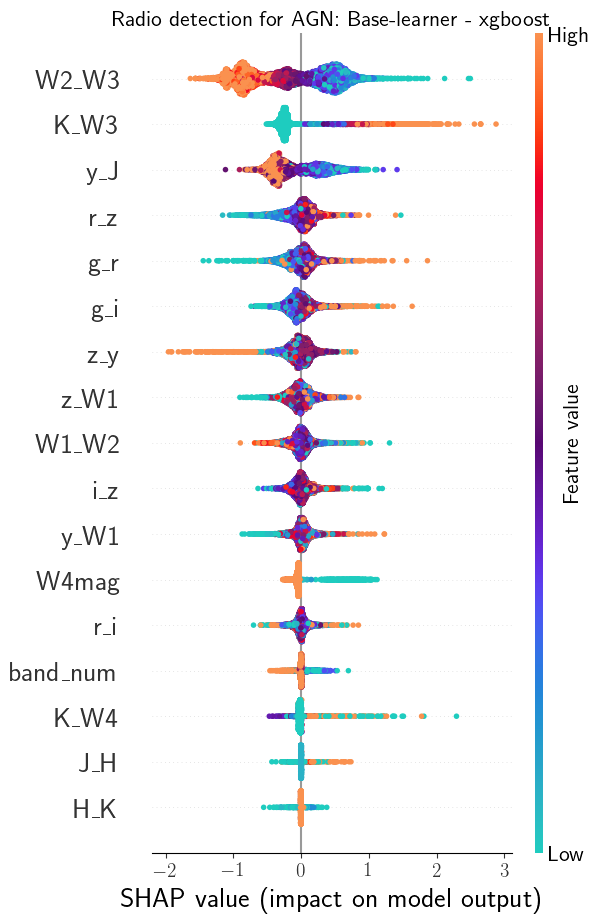

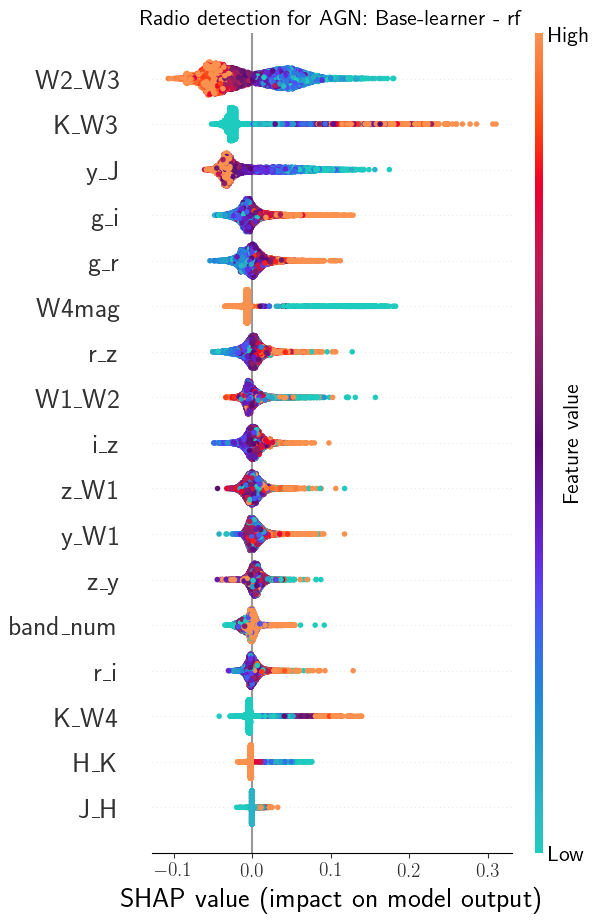

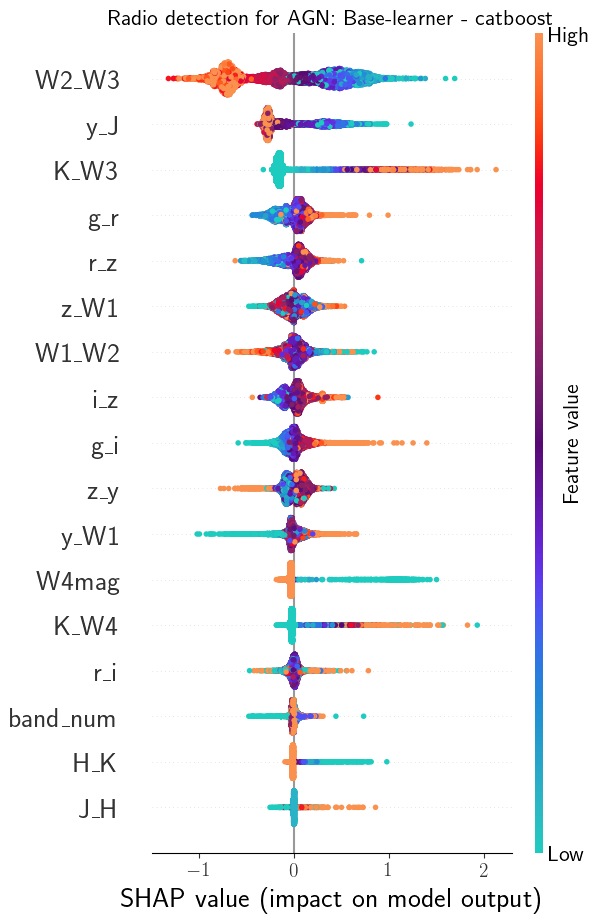

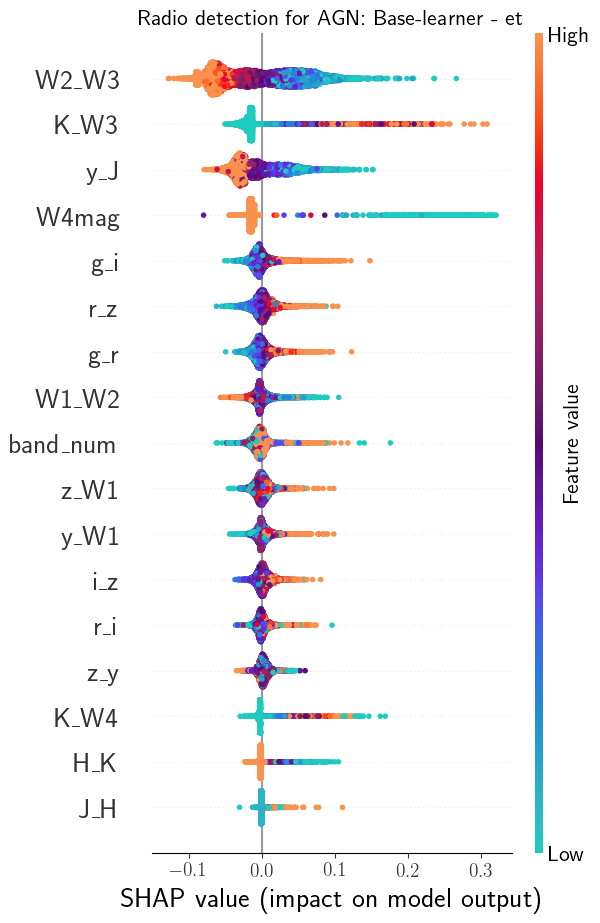

In [76]:
if run_shap_radio_base:
    for model in shap_values_radio_AGN_base.keys():
        gf.plot_shap_beeswarm('Radio detection for AGN', model, shap_values_radio_AGN_base[model], base_meta='Base')
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_radio_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [77]:
# new_base_logit_radio = np.log(gv.radio_thresh / (1 - gv.radio_thresh))
new_base_logit_radio_AGN = np.log(0.5 / (1 - 0.5))

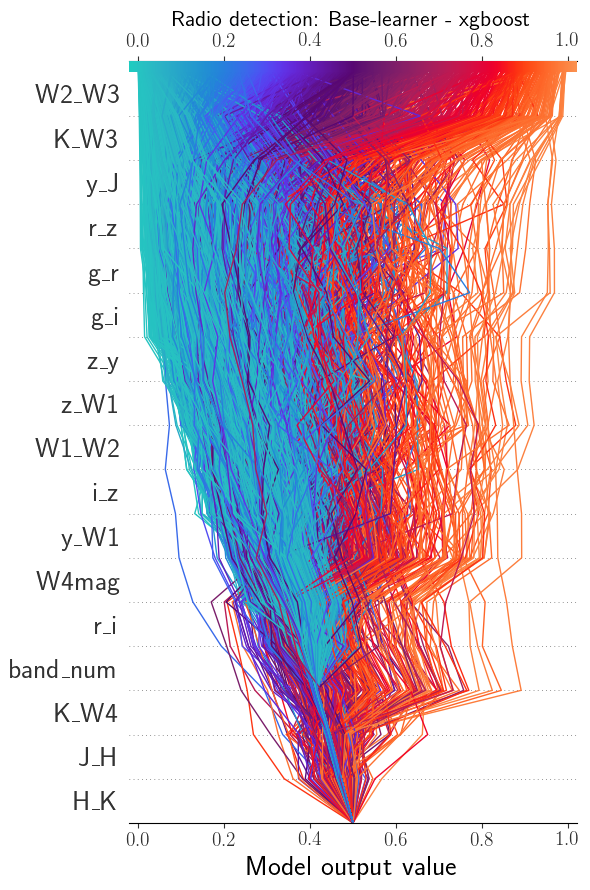

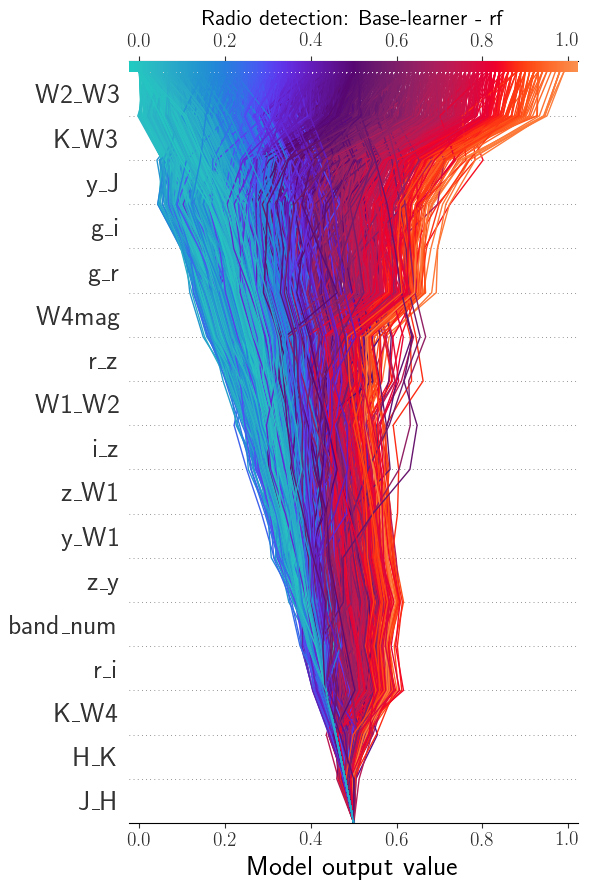

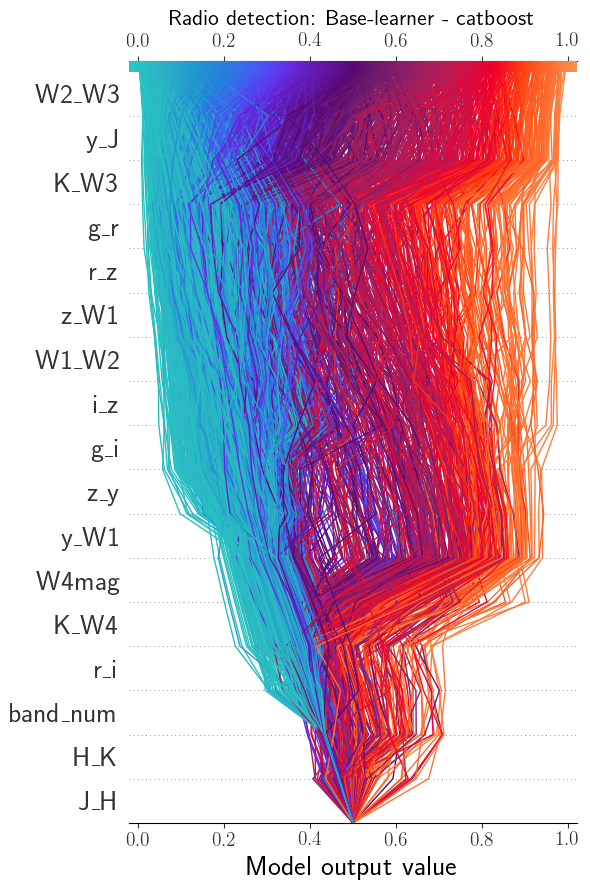

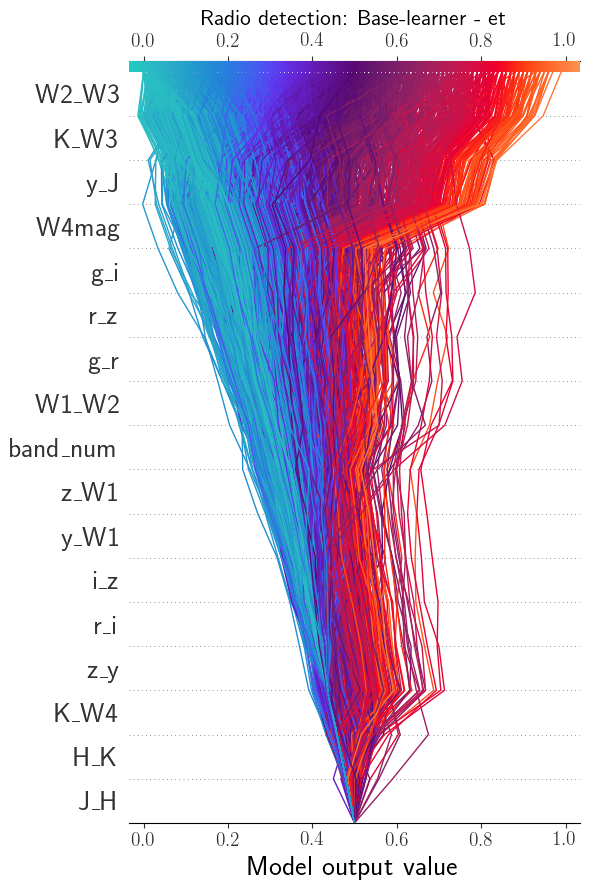

In [78]:
if run_shap_radio_base:
    for model in shap_values_radio_AGN_base.keys():
        size_side          = 6
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            logit_mode     = 'logit'
            new_base_radio_AGN = new_base_logit_radio_AGN
        else:
            logit_mode     = 'identity'
            # new_base_radio = gv.radio_thresh
            new_base_radio_AGN = 0.5
        fig                = plt.figure(figsize=(size_side, size_side * 3/2))
        ax1                = fig.add_subplot(111, xscale='linear', yscale='linear')
        _ = gf.plot_shap_decision('Radio detection', model, shap_values_radio_AGN_base[model],
                                  explainers_radio_AGN_base[model], reduced_cols_radio_AGN, ax1,
                                  logit_mode, new_base_value=new_base_radio_AGN,
                                  base_meta='Base', ignore_warnings=True)
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_decision_radio_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [79]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_AGN = gf.mean_abs_SHAP_base_models(shap_values_radio_AGN_base,
                                                                  list(shap_values_radio_AGN_base.keys()))
    for key in shap_values_radio_AGN_base.keys():
        sorted_mean_abs_SHAP_radio_AGN[key].loc[:, 'Mean_abs_SHAP'] = sorted_mean_abs_SHAP_radio_AGN[key].loc[:, 'Mean_abs_SHAP'] /\
                                                                  sorted_mean_abs_SHAP_radio_AGN[key].loc[:, 'Mean_abs_SHAP'].sum() * 100
    multicol_feat_radio_AGN = [(key, name) for key in sorted_mean_abs_SHAP_radio_AGN.keys() for name in ('Feature', 'Mean_abs_SHAP')]

In [80]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_AGN_base_full_df = pd.concat([sorted_mean_abs_SHAP_radio_AGN[key].reset_index(drop=True) for key in shap_values_radio_AGN_base.keys()], axis=1)
    sorted_mean_abs_SHAP_radio_AGN_base_full_df.columns = pd.MultiIndex.from_tuples(multicol_feat_radio_AGN)
    print('Mean absolute SHAP values scaled to sum 100')
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_radio_AGN_base_full_df)

Mean absolute SHAP values scaled to sum 100


xgboost                      rf                catboost                \
     Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   
0      W2_W3        23.274     W2_W3        18.892     W2_W3        25.193   
1       K_W3        14.374      K_W3        18.172       y_J        13.541   
2        y_J        13.222       y_J        14.797      K_W3        13.288   
3        r_z         6.271       g_i         5.396       g_r         5.571   
4        g_r         5.728       g_r         5.120       r_z         5.539   
5        g_i         5.380     W4mag         4.909      z_W1         4.856   
6        z_y         5.280       r_z         4.675     W1_W2         4.771   
7       z_W1         4.882     W1_W2         4.096       i_z         4.743   
8      W1_W2         4.327       i_z         3.751       g_i         4.461   
9        i_z         4.009      z_W1         3.599       z_y         4.032   
10      y_W1         3.857      y_W1         3.366      y_W1         3.879   
11     W4mag         3.377       z_y         3.118     W4mag         3.422   
12       r_i         2.895  band_num         3.110      K_W4         2.281   
13  band_num         1.687       r_i         2.750       r_i         2.010   
14      K_W4         1.035      K_W4         2.718  band_num         1.280   
15       J_H         0.224       H_K         1.270       H_K         0.881   
16       H_K         0.179       J_H         0.261       J_H         0.253   

          et                
     Feature Mean_abs_SHAP  
0      W2_W3        22.583  
1       K_W3        14.562  
2        y_J        12.940  
3      W4mag        10.270  
4        g_i         4.642  
5        r_z         4.602  
6        g_r         4.203  
7      W1_W2         3.890  
8   band_num         3.825  
9       z_W1         3.361  
10      y_W1         3.148  
11       i_z         3.139  
12       r_i         2.555  
13       z_y         2.505  
14      K_W4         2.089  
15       H_K         1.261  
16       J_H         0.425

In [81]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_AGN = pd.read_hdf(gv.tmp_shap_path + f'mean_abs_SHAP_radio_AGN_meta_{used_area}{subset_str}{high_z_str}.h5', key='df')

In [82]:
if run_shap_radio_base:
    print('Combined mean absolute SHAP values scaled to sum 100')
    sorted_mean_abs_SHAP_radio_AGN_comb = sorted_mean_abs_SHAP_radio_AGN.copy().set_index('Feature')
    for key in shap_values_radio_AGN_base.keys():
        factor = sorted_mean_abs_SHAP_radio_AGN.set_index('Feature').loc[key] / 100
        tmp_feat_imp = sorted_mean_abs_SHAP_radio_AGN_base_full_df.loc[:, key].copy().set_index('Feature')
        sorted_mean_abs_SHAP_radio_AGN_comb = sorted_mean_abs_SHAP_radio_AGN_comb + tmp_feat_imp * factor
    sorted_mean_abs_SHAP_radio_AGN_comb = sorted_mean_abs_SHAP_radio_AGN_comb.sort_values(by=['Mean_abs_SHAP'],
                                                                                  ascending=False).drop(index=list(shap_values_radio_AGN_base.keys()))
    sorted_mean_abs_SHAP_radio_AGN_comb['Cumulative_sum'] = sorted_mean_abs_SHAP_radio_AGN_comb.loc[:, 'Mean_abs_SHAP'].cumsum()
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_radio_AGN_comb)

Combined mean absolute SHAP values scaled to sum 100


,Mean_abs_SHAP,Cumulative_sum
Feature,,
W2_W3,19.978,19.978
K_W3,13.757,33.735
y_J,10.734,44.469
r_z,6.514,50.982
y_W1,6.182,57.165
g_i,6.131,63.296
g_r,5.954,69.250
z_W1,5.662,74.912
W1_W2,5.448,80.359


xgboost


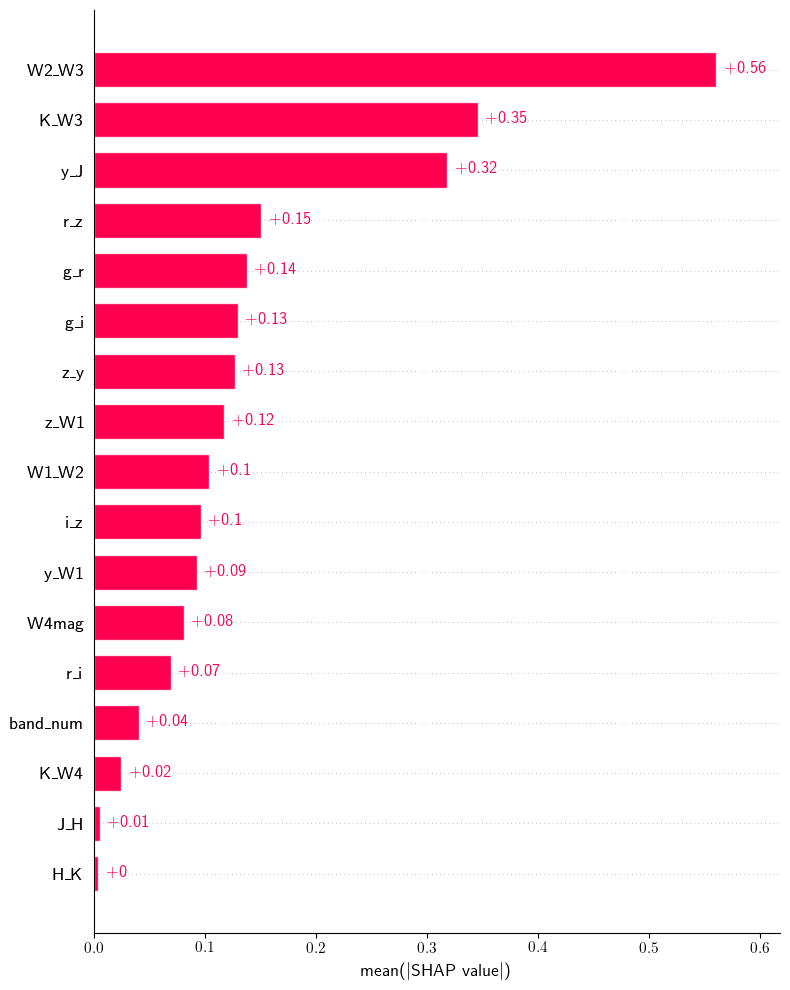

rf


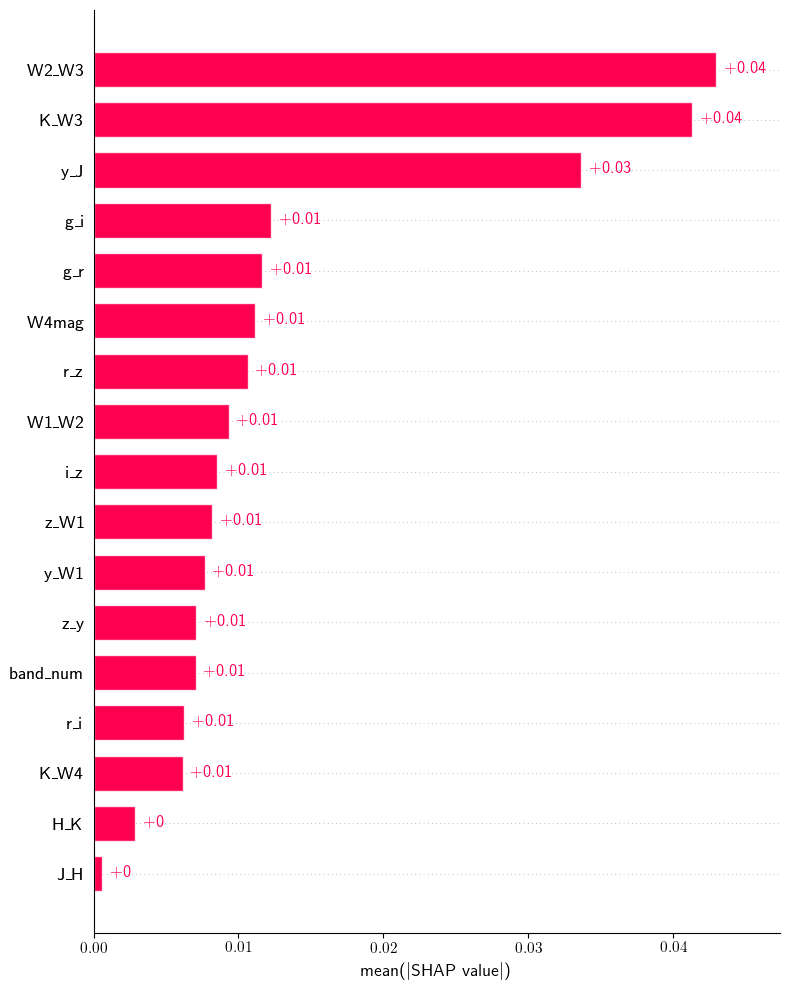

catboost


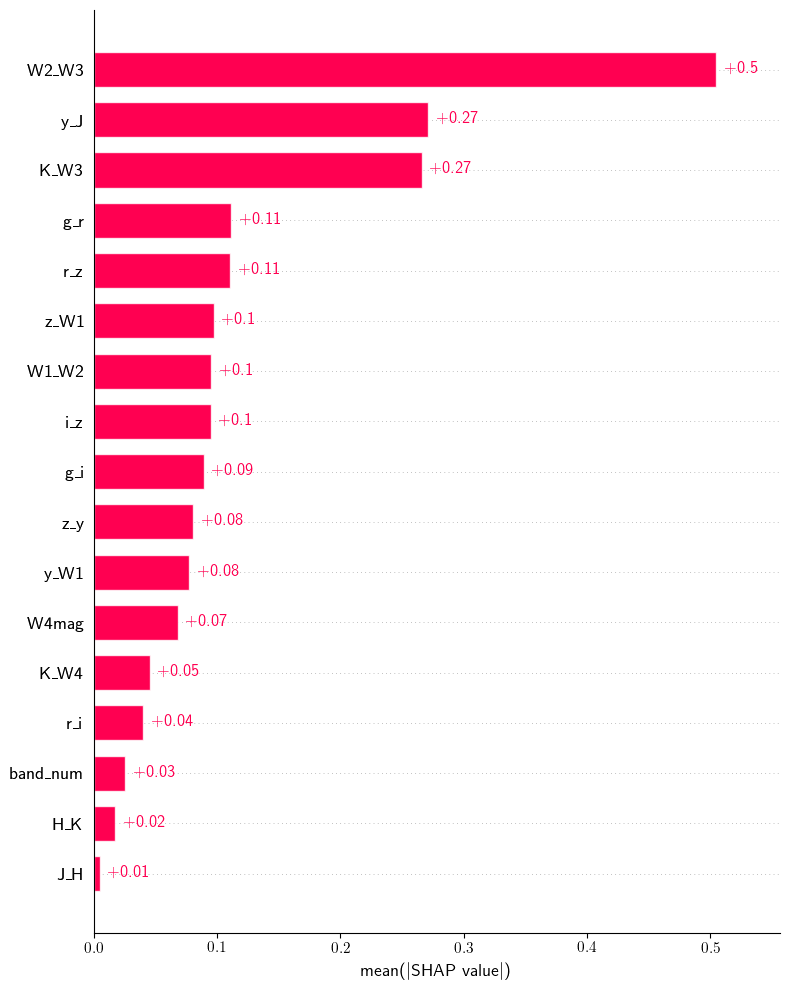

et


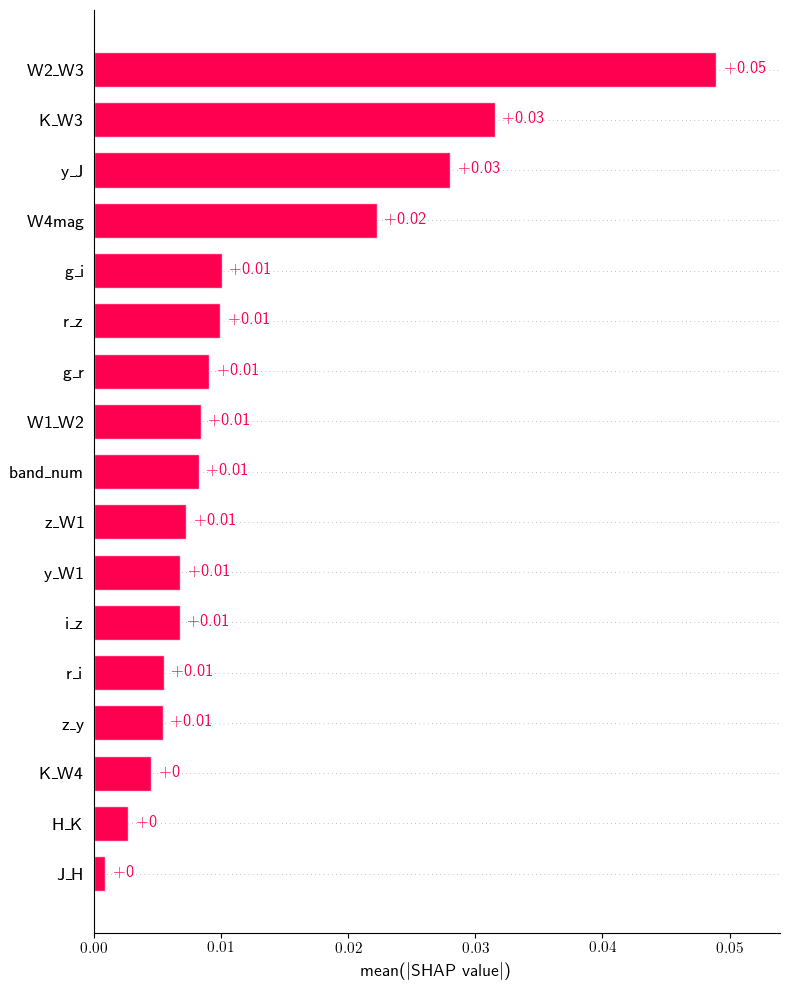

In [83]:
if run_shap_radio_base:
    shp_copies_radio_AGN = {}
    for model in shap_values_radio_AGN_base.keys():
        # Convert from FastTreeShap to Shap object
        shp_copies_radio_AGN[model] = shap.Explanation(values=shap_values_radio_AGN_base[model].values,
                                                       base_values=shap_values_radio_AGN_base[model].base_values,
                                                       data=shap_values_radio_AGN_base[model].data,
                                                       feature_names=shap_values_radio_AGN_base[model].feature_names)
        print(f'{model}')
        if np.ndim(shp_copies_radio_AGN[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_radio_AGN[model], max_display=None, show=False)
        elif np.ndim(shp_copies_radio_AGN[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_radio_AGN[model][:, :, 1], max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

xgboost


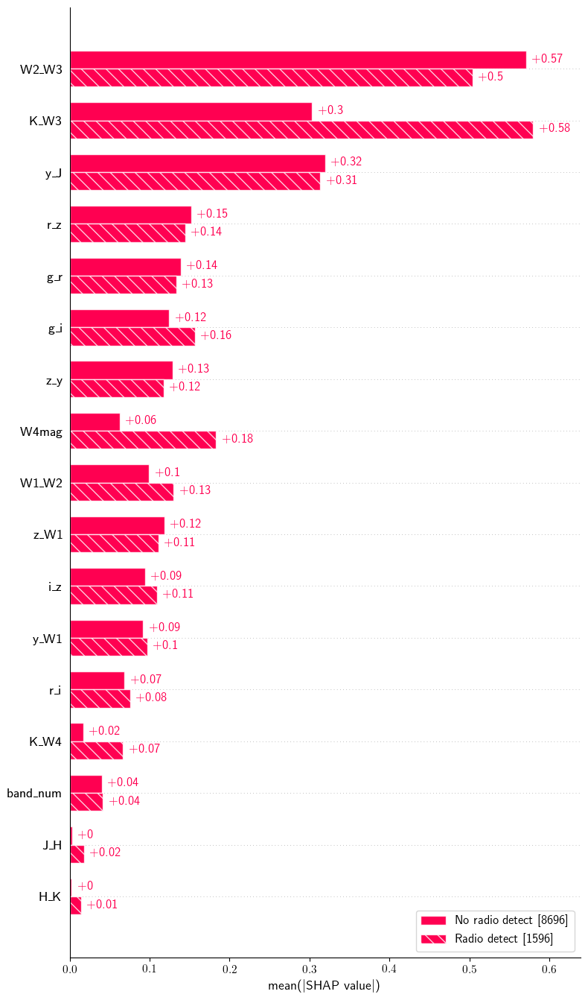

rf


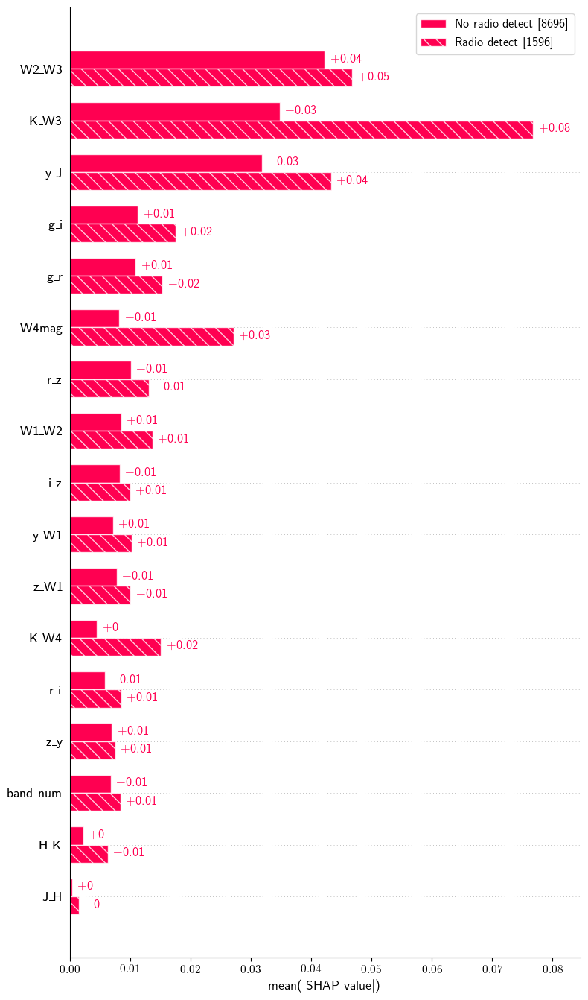

catboost


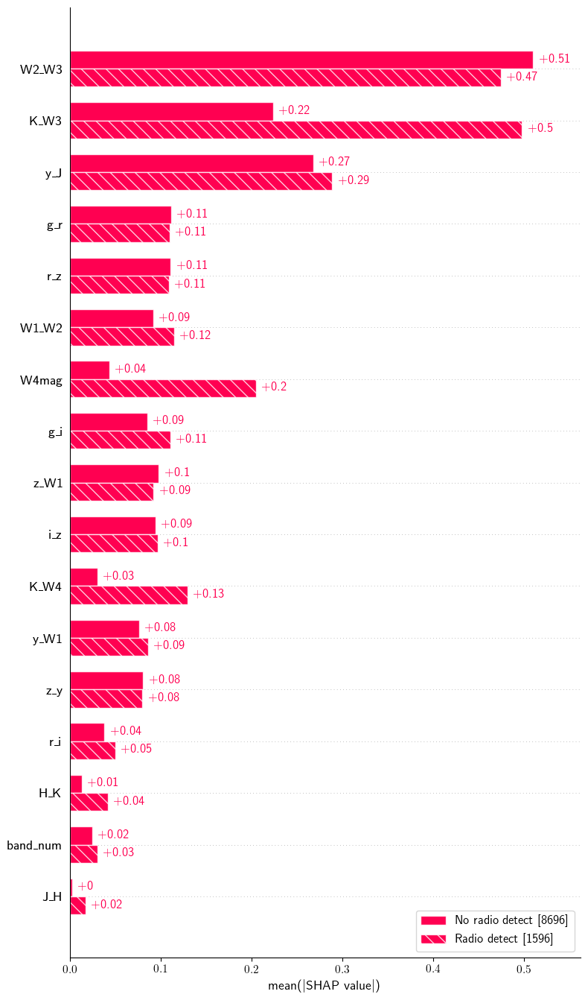

et


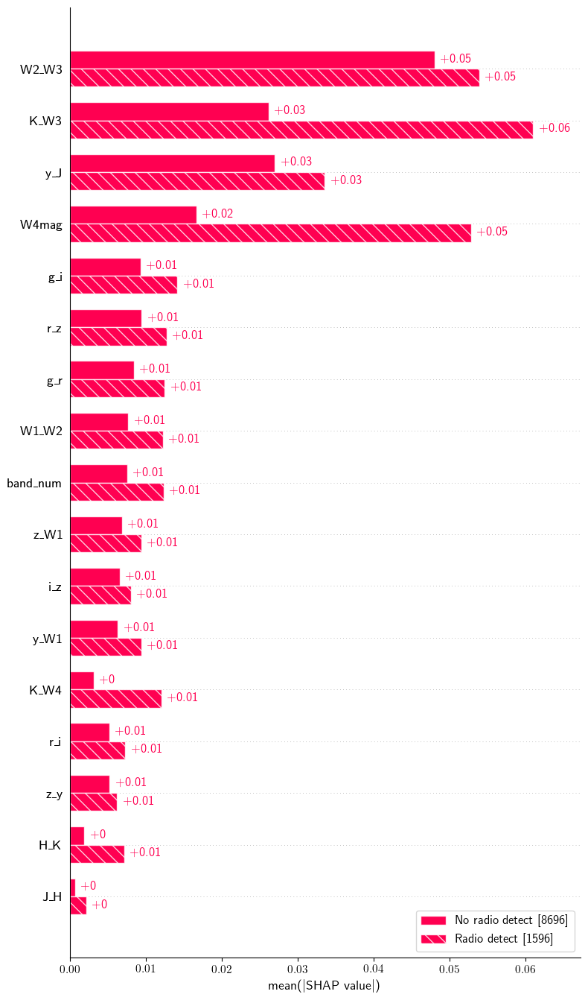

In [84]:
if run_shap_radio_base:
    radio_AGN_labels = ['No radio detect' if elem == 0 else 'Radio detect' for elem in reduced_data_radio_AGN.loc[:, 'LOFAR_detect']]
    for model in shap_values_radio_AGN_base.keys():
        print(f'{model}')
        if np.ndim(shp_copies_radio_AGN[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_radio_AGN[model].cohorts(radio_AGN_labels).abs.mean(0), max_display=None, show=False)
        elif np.ndim(shp_copies_radio_AGN[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_radio_AGN[model][:, :, 1].cohorts(radio_AGN_labels).abs.mean(0), max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

In [85]:
if run_shap_radio_base:
    for count, model in enumerate(shap_values_radio_AGN_base.keys()):
        print(f'\n{model}:')
        # The model's raw prediction for the first observation.
        print(radio_det_AGN_clf.named_steps['trained_model'].estimators_[count].predict(reduced_data_radio_AGN_df.drop(columns=base_models_name_radio_AGN))[0].round(5))
    
        # The corresponding sum of the mean + shap values
        print((np.array([explainers_radio_AGN_base[model].expected_value]).flatten()[-1] + shap_values_radio_AGN_base[model].values[0].sum()).round(5))


xgboost:
0
-1.71265

rf:
0
0.15903

catboost:
0
-2.55026

et:
0
0.15882


---

#### SHAP - Radio detection model for SFG

In [86]:
if run_shap_radio_base:
    model_name_radio_SFG = type(radio_det_SFG_clf.named_steps['trained_model'].final_estimator_).__name__.replace('Classifier', '')

SHAP does not need to use the full dataset for its analysis. Around $N=1000$ is a good number.

In [87]:
np.shape(data_SFG)

(13455, 50)

In [88]:
if run_shap_radio_base:
    sample_size_radio_SFG   = 15000
    sample_size_radio_SFG   = np.nanmin([sample_size_radio_SFG, np.shape(data_SFG)[0]])
    print(f'Number of selected elements: {sample_size_radio_SFG:,}')

Number of selected elements: 13,455


In [89]:
if run_shap_radio_base:
    base_models_name_radio_SFG   = gf.get_base_estimators_names(radio_det_SFG_clf)

In [90]:
if run_shap_radio_base:
    reduced_data_radio_SFG    = data_SFG.sample(n=sample_size_radio_SFG, random_state=gv.seed).copy()
    display(reduced_data_radio_SFG.loc[:, ['LOFAR_detect', 'pred_radio_SFG_cal']].describe())
    reduced_data_radio_SFG_df = gf.preprocess_data(radio_det_SFG_clf, reduced_data_radio_SFG, base_models_name_radio_SFG)
    reduced_cols_radio_SFG    = reduced_data_radio_SFG_df.columns.drop(base_models_name_radio_SFG)

,LOFAR_detect,pred_radio_SFG_cal
count,13455.000000,13455.000000
mean,0.153995,0.149015
std,0.360957,0.356117
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,1.000000,1.000000


Use FastTreeSHAP package

In [91]:
if run_shap_radio_base:
    explainers_radio_SFG_base           = {}
    for model, model_fit in zip(radio_det_SFG_clf.named_steps['trained_model'].estimators,
                                radio_det_SFG_clf.named_steps['trained_model'].estimators_):
        explainers_radio_SFG_base[model[0]] = fasttreeshap.TreeExplainer(model_fit, data=None,
                                                                         feature_perturbation='tree_path_dependent',
                                                                         model_output='raw', feature_dependence='independent',
                                                                         algorithm='auto', n_jobs=12)

In [92]:
if run_shap_radio_base:
    shap_values_radio_SFG_base = {}
    for model in explainers_radio_SFG_base.keys():
        print(f'Working with base model {model}')
        shap_values_radio_SFG_base[model] = explainers_radio_SFG_base[model](reduced_data_radio_SFG_df.drop(columns=base_models_name_radio_SFG))

Working with base model catboost
Working with base model xgboost
Working with base model et
Working with base model gbc


In [93]:
if run_shap_radio_base:
    print('Expected "logit" values per base model')
    print('-' * 30)
    for model in explainers_radio_SFG_base.keys():
        expected_value = np.array([explainers_radio_SFG_base[model].expected_value]).flatten()[-1]
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            print(f'{model: <10}\t: {np.exp(expected_value) / (1 + np.exp(expected_value)): .4f}')
        else:
            print(f'{model: <10}\t: {expected_value: .4f}')

Expected "logit" values per base model
------------------------------
catboost  	:  0.0971
xgboost   	:  0.1199
et        	:  0.1441
gbc       	:  0.1092


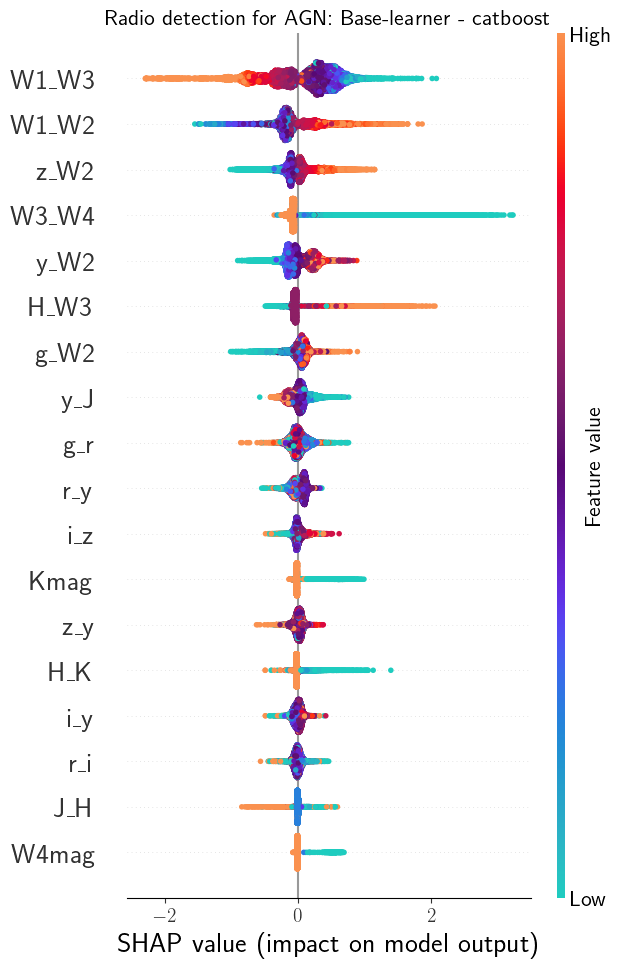

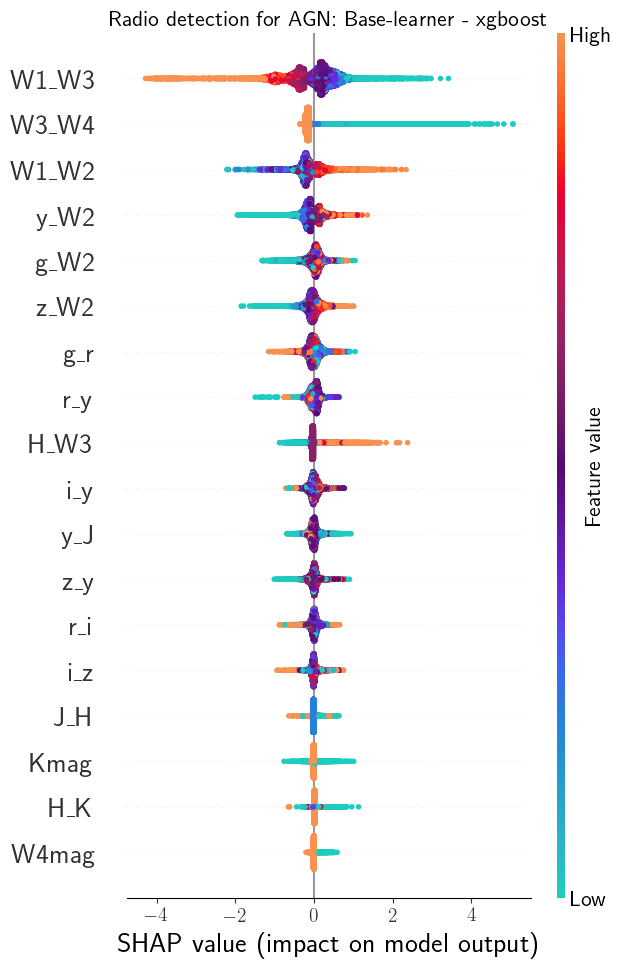

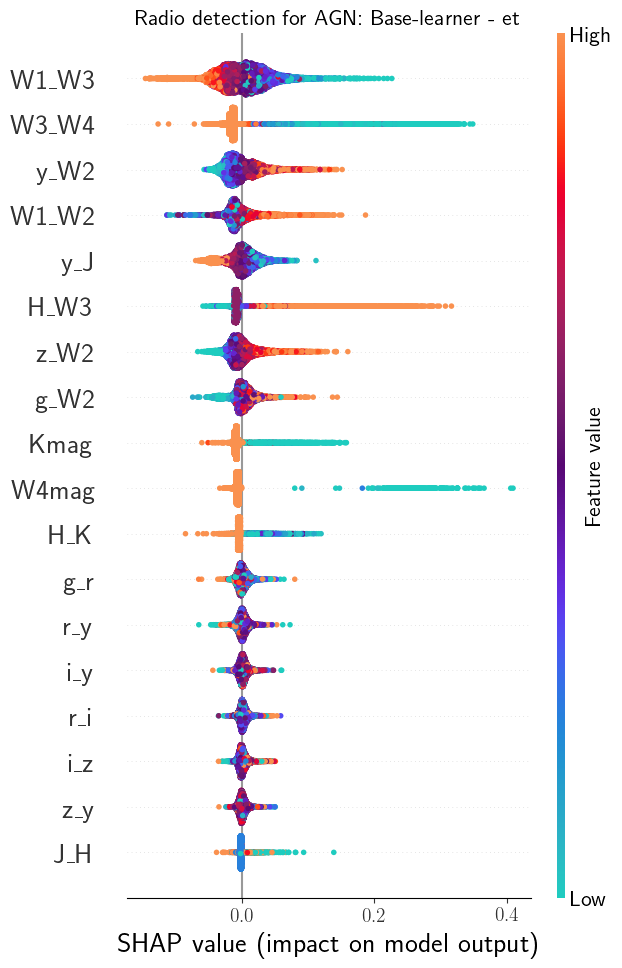

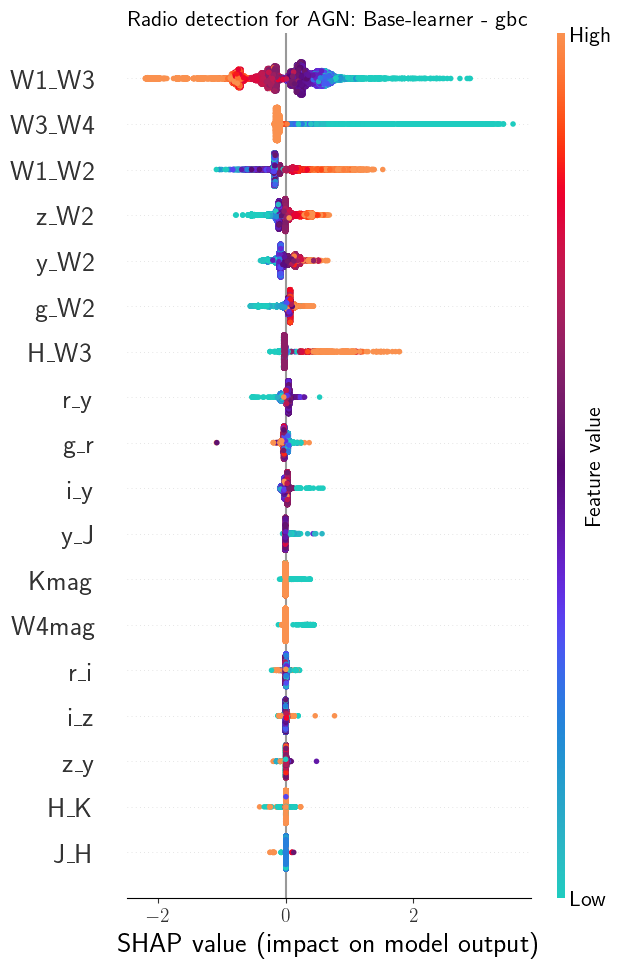

In [94]:
if run_shap_radio_base:
    for model in shap_values_radio_SFG_base.keys():
        gf.plot_shap_beeswarm('Radio detection for AGN', model, shap_values_radio_SFG_base[model], base_meta='Base')
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_radio_SFG_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [95]:
# new_base_logit_radio = np.log(gv.radio_thresh / (1 - gv.radio_thresh))
new_base_logit_radio_SFG = np.log(0.5 / (1 - 0.5))

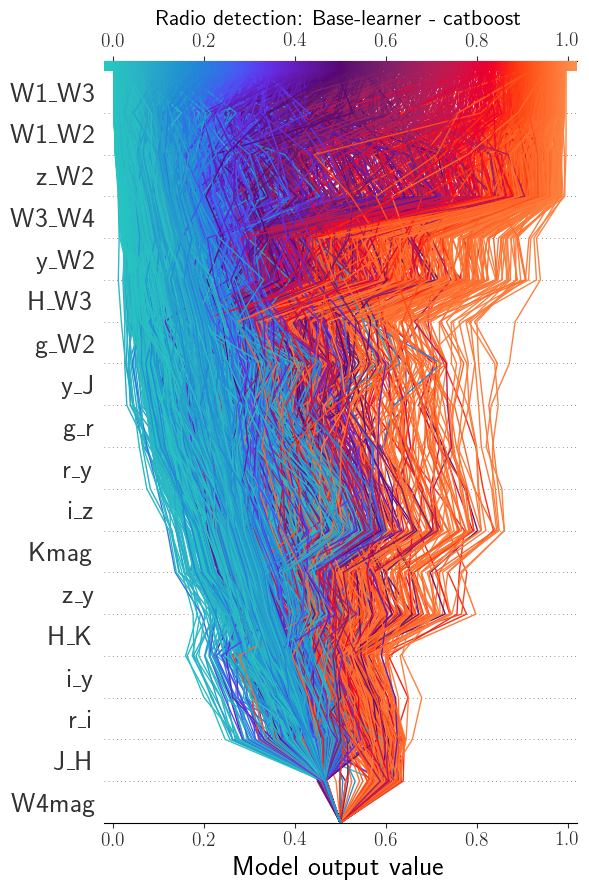

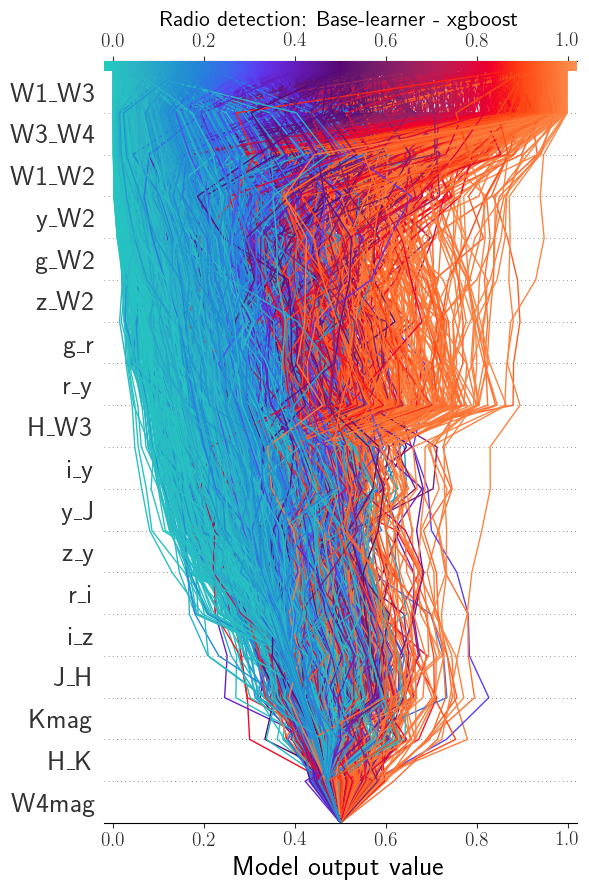

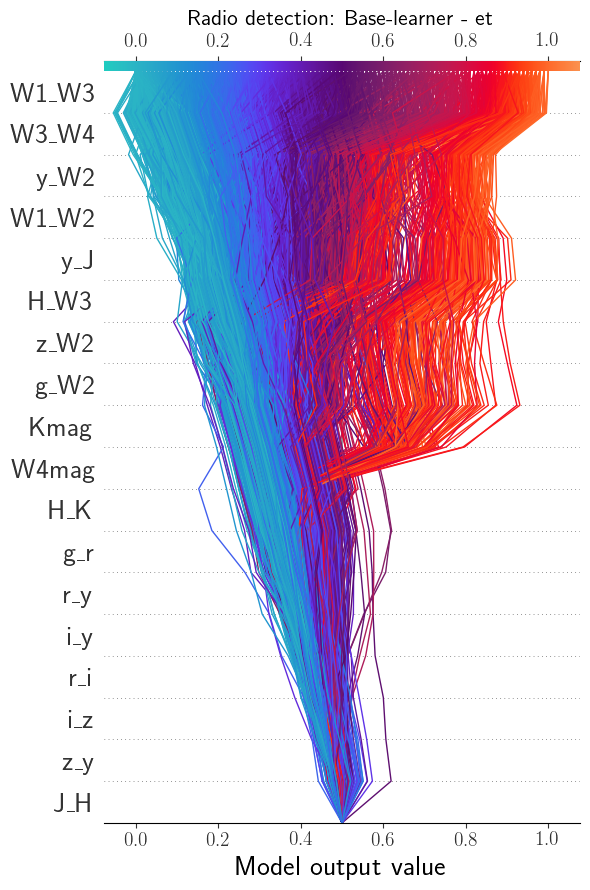

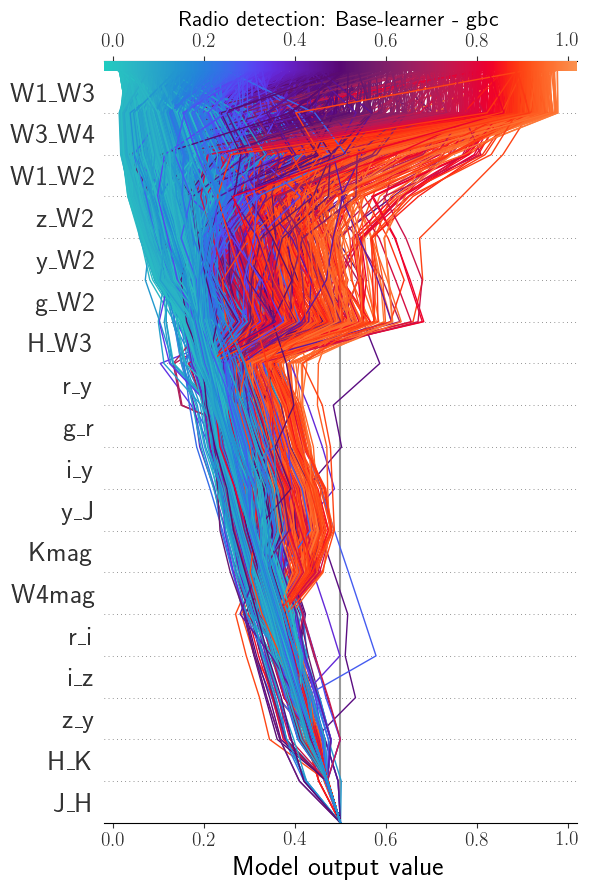

In [96]:
if run_shap_radio_base:
    for model in shap_values_radio_SFG_base.keys():
        size_side          = 6
        if model in ['lightgbm', 'xgboost', 'catboost', 'gbc']:
            logit_mode     = 'logit'
            new_base_radio_SFG = new_base_logit_radio_SFG
        else:
            logit_mode     = 'identity'
            # new_base_radio = gv.radio_thresh
            new_base_radio_SFG = 0.5
        fig                = plt.figure(figsize=(size_side, size_side * 3/2))
        ax1                = fig.add_subplot(111, xscale='linear', yscale='linear')
        _ = gf.plot_shap_decision('Radio detection', model, shap_values_radio_SFG_base[model],
                                  explainers_radio_SFG_base[model], reduced_cols_radio_SFG, ax1,
                                  logit_mode, new_base_value=new_base_radio_SFG, base_meta='Base',
                                  ignore_warnings=True)
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_decision_radio_SFG_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [97]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_SFG = gf.mean_abs_SHAP_base_models(shap_values_radio_SFG_base,
                                                                  list(shap_values_radio_SFG_base.keys()))
    for key in shap_values_radio_SFG_base.keys():
        sorted_mean_abs_SHAP_radio_SFG[key].loc[:, 'Mean_abs_SHAP'] = sorted_mean_abs_SHAP_radio_SFG[key].loc[:, 'Mean_abs_SHAP'] /\
                                                                  sorted_mean_abs_SHAP_radio_SFG[key].loc[:, 'Mean_abs_SHAP'].sum() * 100
    multicol_feat_radio_SFG = [(key, name) for key in sorted_mean_abs_SHAP_radio_SFG.keys() for name in ('Feature', 'Mean_abs_SHAP')]

In [98]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_SFG_base_full_df = pd.concat([sorted_mean_abs_SHAP_radio_SFG[key].reset_index(drop=True) for key in shap_values_radio_SFG_base.keys()], axis=1)
    sorted_mean_abs_SHAP_radio_SFG_base_full_df.columns = pd.MultiIndex.from_tuples(multicol_feat_radio_SFG)
    print('Mean absolute SHAP values scaled to sum 100')
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_radio_SFG_base_full_df)

Mean absolute SHAP values scaled to sum 100


catboost               xgboost                    et                   gbc  \
    Feature Mean_abs_SHAP Feature Mean_abs_SHAP Feature Mean_abs_SHAP Feature   
0     W1_W3        21.939   W1_W3        22.627   W1_W3        13.829   W1_W3   
1     W1_W2        12.718   W3_W4        12.144   W3_W4        13.138   W3_W4   
2      z_W2         8.704   W1_W2        11.905    y_W2         9.014   W1_W2   
3     W3_W4         8.197    y_W2         8.547   W1_W2         7.620    z_W2   
4      y_W2         7.985    g_W2         6.255     y_J         7.402    y_W2   
5      H_W3         5.883    z_W2         6.220    H_W3         7.259    g_W2   
6      g_W2         5.412     g_r         4.801    z_W2         7.188    H_W3   
7       y_J         5.020     r_y         4.022    g_W2         5.524     r_y   
8       g_r         4.132    H_W3         3.971    Kmag         5.458     g_r   
9       r_y         3.880     i_y         3.724   W4mag         4.550     i_y   
10      i_z         2.800     y_J         3.370     H_K         3.345     y_J   
11     Kmag         2.355     z_y         3.349     g_r         2.835    Kmag   
12      z_y         2.334     r_i         2.923     r_y         2.626   W4mag   
13      H_K         2.282     i_z         2.704     i_y         2.412     r_i   
14      i_y         2.259     J_H         1.106     r_i         2.232     i_z   
15      r_i         2.114    Kmag         0.999     i_z         2.221     z_y   
16      J_H         1.118     H_K         0.997     z_y         1.994     H_K   
17    W4mag         0.865   W4mag         0.338     J_H         1.353     J_H   

                  
   Mean_abs_SHAP  
0         31.411  
1         16.267  
2         14.199  
3          9.230  
4          7.220  
5          5.557  
6          4.499  
7          3.054  
8          2.249  
9          1.867  
10         1.111  
11         0.827  
12         0.816  
13         0.647  
14         0.548  
15         0.310  
16         0.153  
17         0.032

In [99]:
if run_shap_radio_base:
    sorted_mean_abs_SHAP_radio_SFG = pd.read_hdf(gv.tmp_shap_path + f'mean_abs_SHAP_radio_SFG_meta_{used_area}{subset_str}{high_z_str}.h5', key='df')

In [100]:
if run_shap_radio_base:
    print('Combined mean absolute SHAP values scaled to sum 100')
    sorted_mean_abs_SHAP_radio_SFG_comb = sorted_mean_abs_SHAP_radio_SFG.copy().set_index('Feature')
    for key in shap_values_radio_SFG_base.keys():
        factor = sorted_mean_abs_SHAP_radio_SFG.set_index('Feature').loc[key] / 100
        tmp_feat_imp = sorted_mean_abs_SHAP_radio_SFG_base_full_df.loc[:, key].copy().set_index('Feature')
        sorted_mean_abs_SHAP_radio_SFG_comb = sorted_mean_abs_SHAP_radio_SFG_comb + tmp_feat_imp * factor
    sorted_mean_abs_SHAP_radio_SFG_comb = sorted_mean_abs_SHAP_radio_SFG_comb.sort_values(by=['Mean_abs_SHAP'],
                                                                                  ascending=False).drop(index=list(shap_values_radio_SFG_base.keys()))
    sorted_mean_abs_SHAP_radio_SFG_comb['Cumulative_sum'] = sorted_mean_abs_SHAP_radio_SFG_comb.loc[:, 'Mean_abs_SHAP'].cumsum()
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_radio_SFG_comb)

Combined mean absolute SHAP values scaled to sum 100


,Mean_abs_SHAP,Cumulative_sum
Feature,,
W1_W3,25.477,25.477
W3_W4,15.245,40.722
W1_W2,11.470,52.192
z_W2,7.540,59.733
y_W2,7.068,66.801
g_W2,6.677,73.478
H_W3,5.936,79.414
y_J,3.992,83.406
r_y,3.154,86.560


catboost


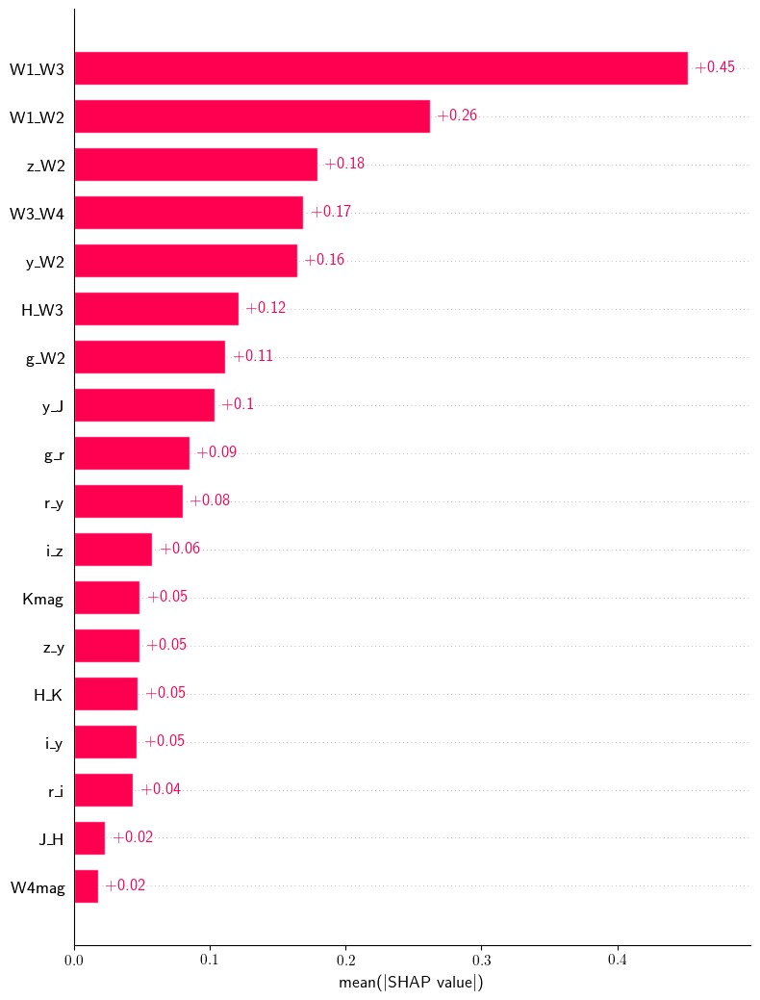

xgboost


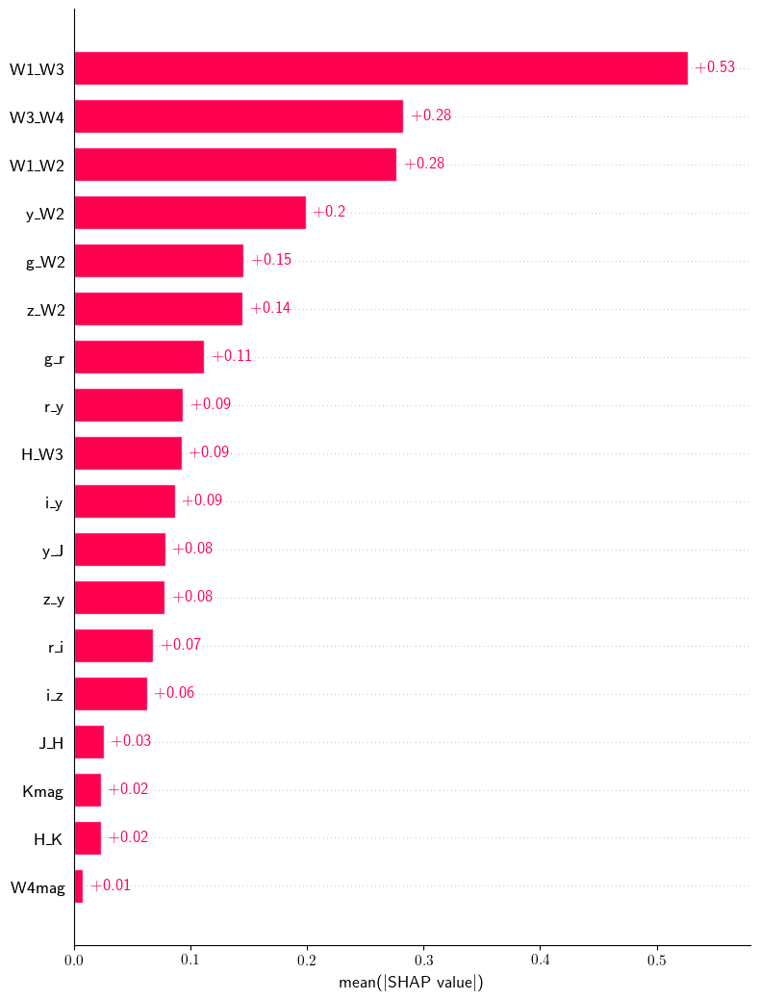

et


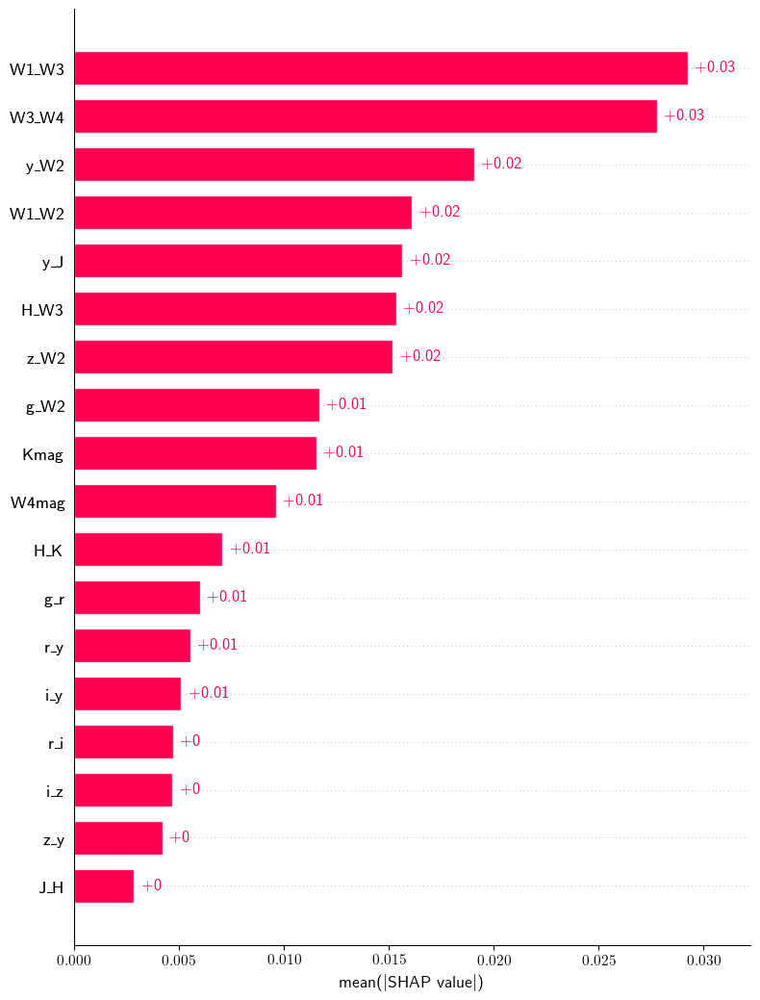

gbc


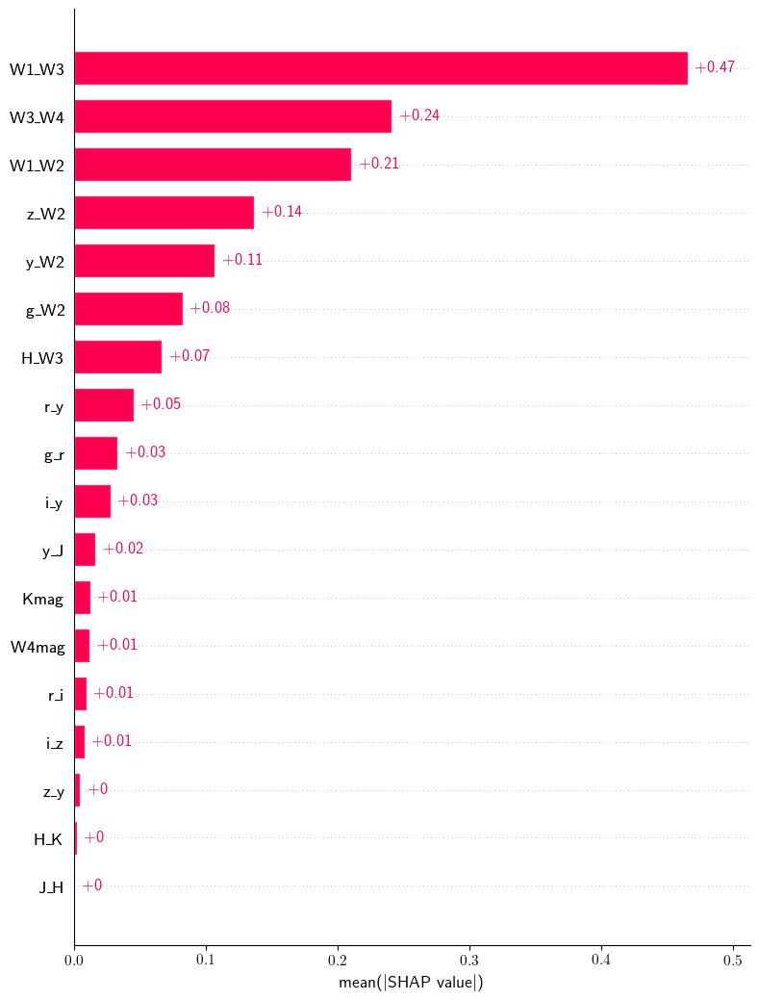

In [101]:
if run_shap_radio_base:
    shp_copies_radio_SFG = {}
    for model in shap_values_radio_SFG_base.keys():
        # Convert from FastTreeShap to Shap object
        shp_copies_radio_SFG[model] = shap.Explanation(values=shap_values_radio_SFG_base[model].values,
                                                       base_values=shap_values_radio_SFG_base[model].base_values,
                                                       data=shap_values_radio_SFG_base[model].data,
                                                       feature_names=shap_values_radio_SFG_base[model].feature_names)
        print(f'{model}')
        if np.ndim(shp_copies_radio_SFG[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_radio_SFG[model], max_display=None, show=False)
        elif np.ndim(shp_copies_radio_SFG[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_radio_SFG[model][:, :, 1], max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

catboost


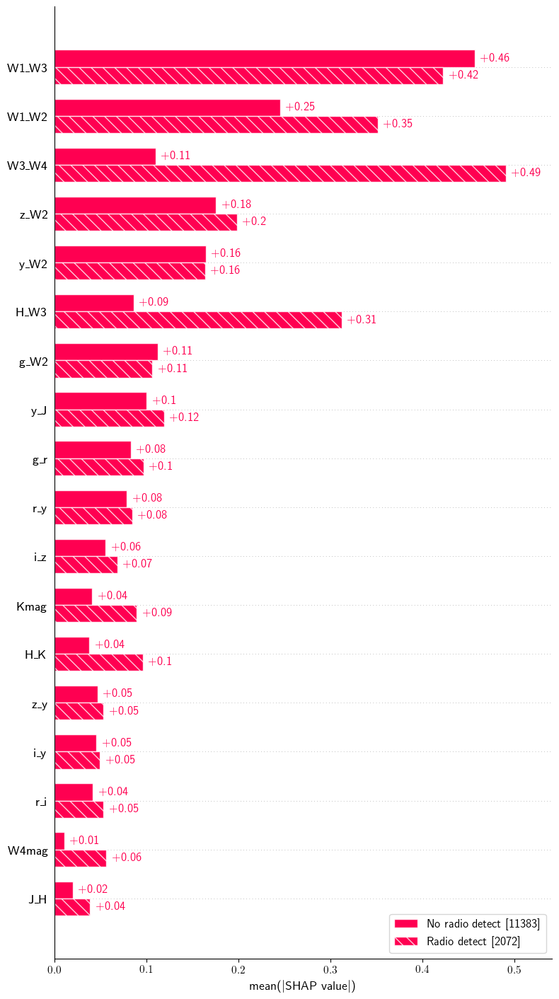

xgboost


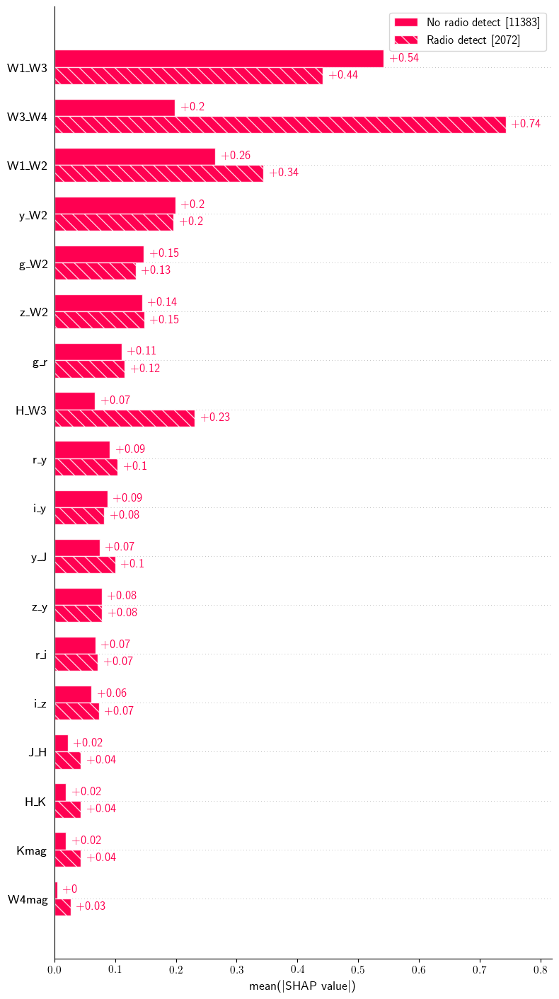

et


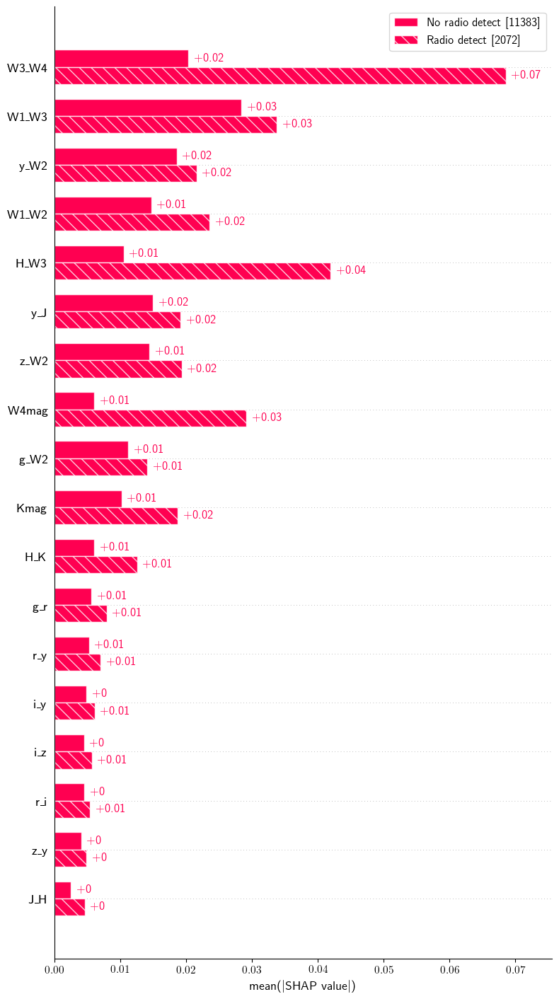

gbc


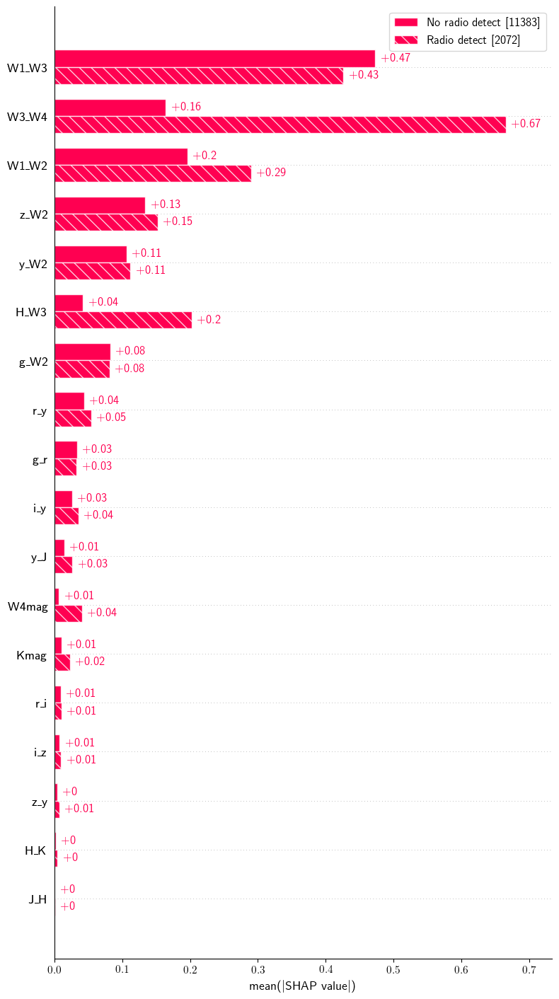

In [102]:
if run_shap_radio_base:
    radio_SFG_labels = ['No radio detect' if elem == 0 else 'Radio detect' for elem in reduced_data_radio_SFG.loc[:, 'LOFAR_detect']]
    for model in shap_values_radio_SFG_base.keys():
        print(f'{model}')
        if np.ndim(shp_copies_radio_SFG[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_radio_SFG[model].cohorts(radio_SFG_labels).abs.mean(0), max_display=None, show=False)
        elif np.ndim(shp_copies_radio_SFG[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_radio_SFG[model][:, :, 1].cohorts(radio_SFG_labels).abs.mean(0), max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

In [103]:
if run_shap_radio_base:
    for count, model in enumerate(shap_values_radio_SFG_base.keys()):
        print(f'\n{model}:')
        # The model's raw prediction for the first observation.
        print(radio_det_SFG_clf.named_steps['trained_model'].estimators_[count].predict(reduced_data_radio_SFG_df.drop(columns=base_models_name_radio_SFG))[0].round(5))
    
        # The corresponding sum of the mean + shap values
        print((np.array([explainers_radio_SFG_base[model].expected_value]).flatten()[-1] + shap_values_radio_SFG_base[model].values[0].sum()).round(5))


catboost:
0
-1.65288

xgboost:
0
-1.401

et:
0
0.14412

gbc:
0
-0.14254


---

#### SHAP - Redshift prediction model for radio AGN

In [104]:
if run_shap_z_base:
    model_name_z_AGN = type(redshift_reg_rAGN.named_steps['trained_model'].final_estimator_).__name__.replace('Regressor', '')

SHAP does not need to use the full dataset for its analysis. Around $N=1000$ (or less) is a good number.

In [105]:
np.shape(data_radio_AGN)

(1783, 50)

In [106]:
if run_shap_z_base:
    sample_size_z_AGN        = 2500
    sample_size_z_AGN        = np.nanmin([sample_size_z_AGN, np.shape(data_radio_AGN)[0]])
    print(f'Number of selected elements: {sample_size_z_AGN:,}')

Number of selected elements: 1,783


In [107]:
if run_shap_z_base:
    base_models_name_z_AGN = gf.get_base_estimators_names(redshift_reg_rAGN)

In [108]:
if run_shap_z_base:
    reduced_data_z_AGN    = data_radio_AGN.sample(n=sample_size_z_AGN, random_state=gv.seed).copy()
    display(reduced_data_z_AGN.loc[:, ['Z', 'pred_Z_rAGN']].describe())
    reduced_data_z_AGN_df = gf.preprocess_data(redshift_reg_rAGN, reduced_data_z_AGN, base_models_name_z_AGN)
    reduced_cols_z_AGN    = reduced_data_z_AGN_df.columns.drop(base_models_name_z_AGN)

,Z,pred_Z_rAGN
count,1783.000000,1783.000000
mean,1.188179,1.250772
std,0.831846,0.772785
min,0.000000,0.022300
25%,0.502000,0.643550
50%,1.070000,1.156600
75%,1.751000,1.842450
max,4.738000,4.514300


Use FastTreeSHAP package

In [109]:
if run_shap_z_base:
    explainers_z_AGN_base           = {}
    for model, model_fit in zip(redshift_reg_rAGN.named_steps['trained_model'].estimators, redshift_reg_rAGN.named_steps['trained_model'].estimators_):
        explainers_z_AGN_base[model[0]] = fasttreeshap.TreeExplainer(model_fit, data=None, feature_perturbation='tree_path_dependent',
                                                                     model_output='raw', feature_dependence='independent',
                                                                     algorithm='auto', n_jobs=12)

In [110]:
if run_shap_z_base:
    shap_values_z_AGN_base = {}
    for model in explainers_z_AGN_base.keys():
        print(f'Working with base model {model}')
        shap_values_z_AGN_base[model] = explainers_z_AGN_base[model](reduced_data_z_AGN_df.drop(columns=base_models_name_z_AGN))

Working with base model et
Working with base model catboost
Working with base model xgboost
Working with base model gbr


In [111]:
if run_shap_z_base:
    print('Expected "logit" values per base model')
    print('-' * 30)
    for model in explainers_z_AGN_base.keys():
        try:
            print(f'{model: <10}\t: {explainers_z_AGN_base[model].expected_value[-1]: .4f}')
        except:
            print(f'{model: <10}\t: {explainers_z_AGN_base[model].expected_value: .4f}')

Expected "logit" values per base model
------------------------------
et        	:  1.3323
catboost  	:  1.3323
xgboost   	:  1.3323
gbr       	:  1.3323


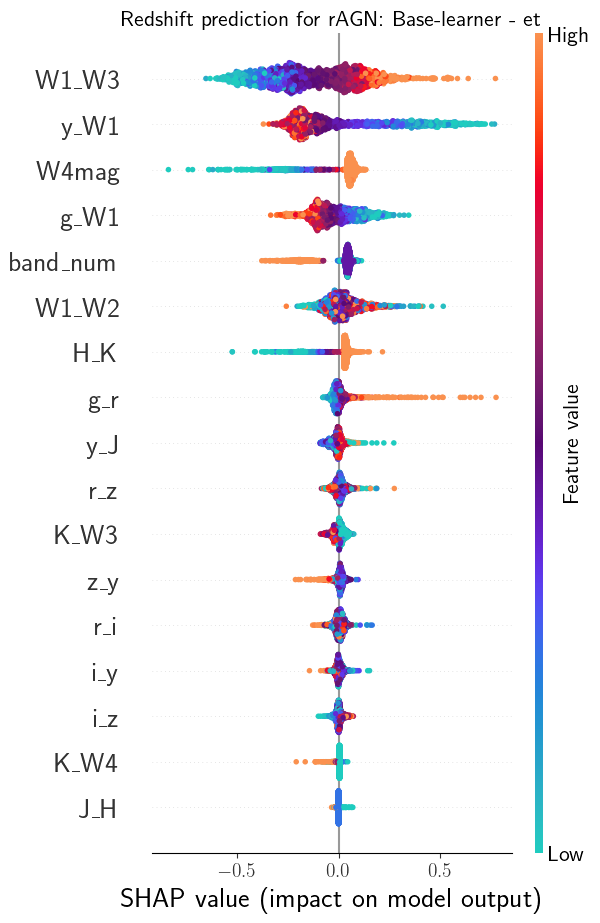

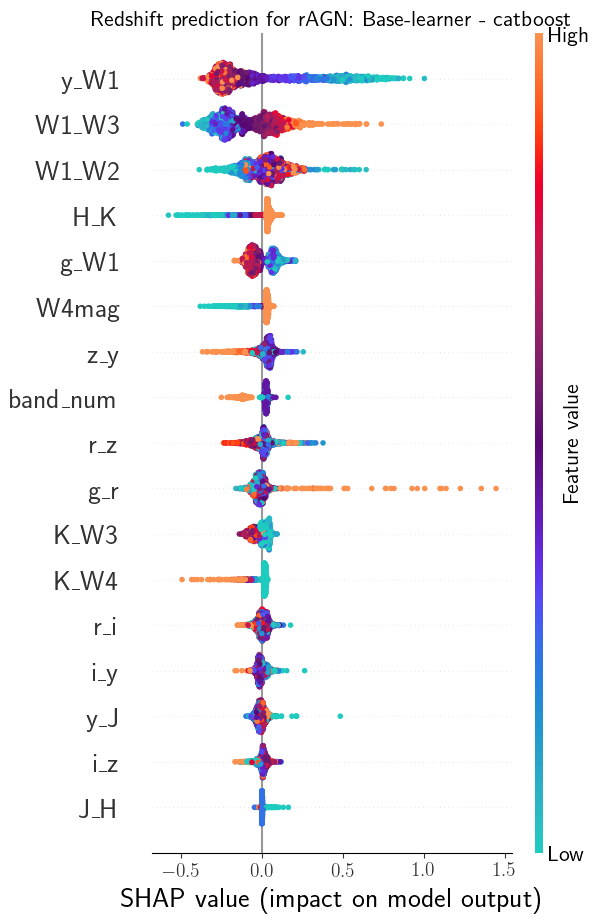

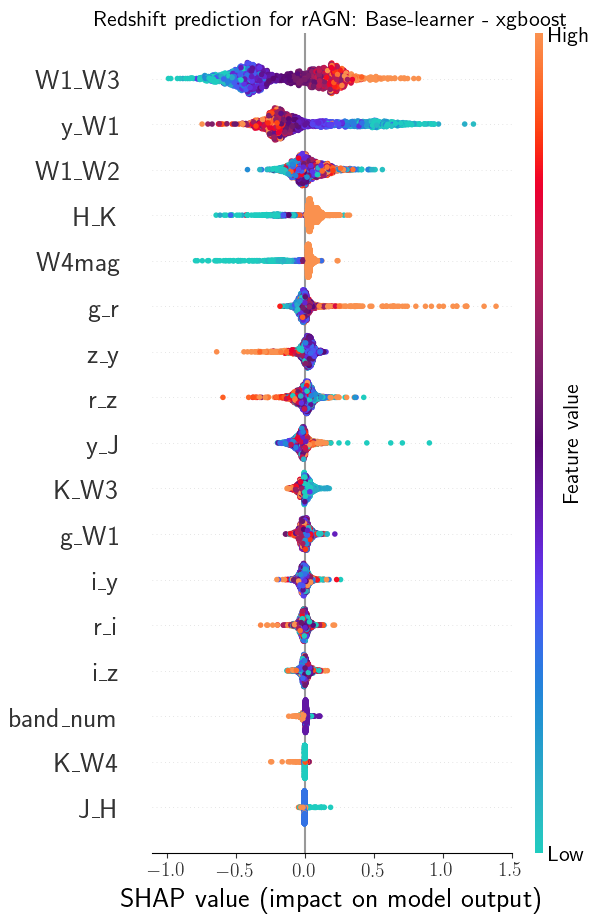

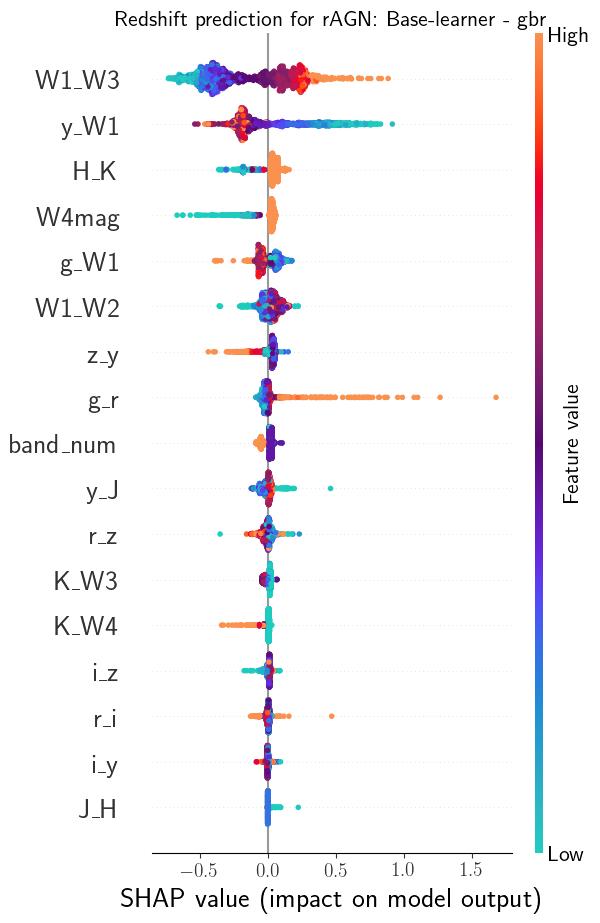

In [112]:
if run_shap_z_base:
    for model in shap_values_z_AGN_base.keys():
        gf.plot_shap_beeswarm('Redshift prediction for rAGN', model, shap_values_z_AGN_base[model], base_meta='Base')
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_z_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

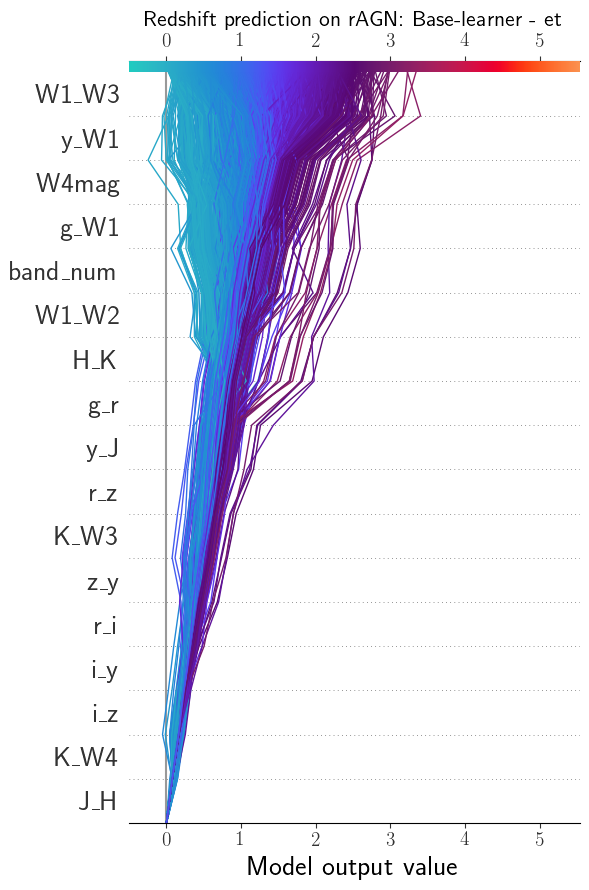

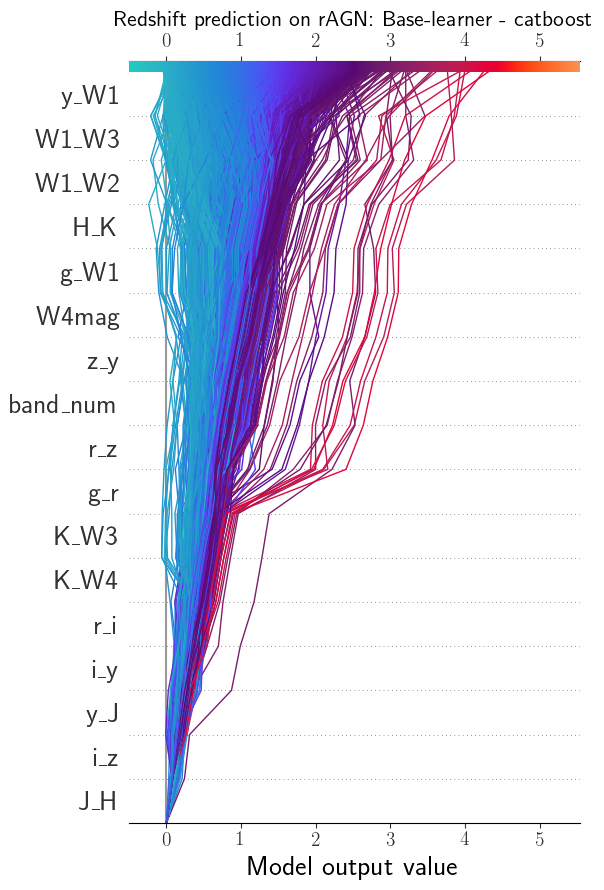

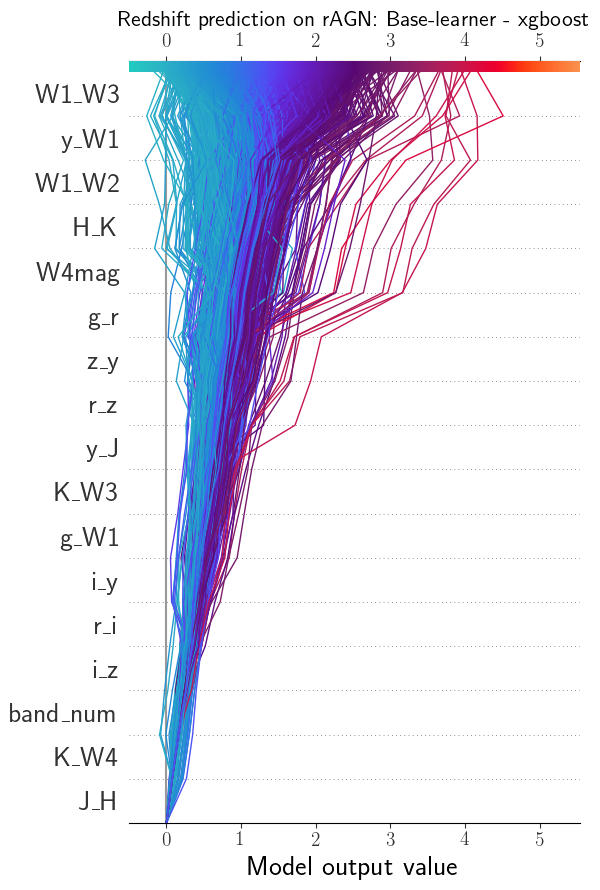

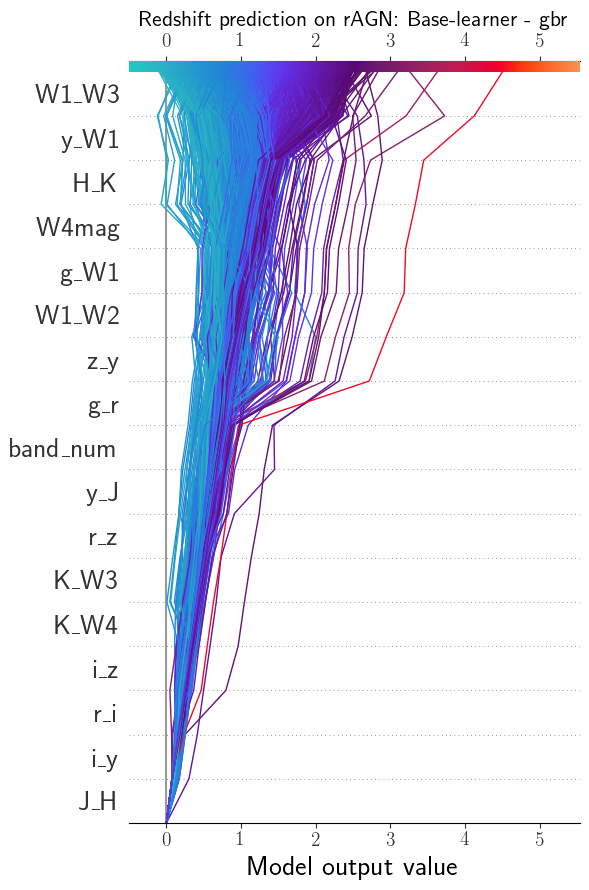

In [113]:
if run_shap_z_base:
    xlims_plt_z_AGN         = (-0.5, data_radio_AGN.loc[reduced_data_z_AGN_df.index, ['Z', 'pred_Z_rAGN']].max().max() + 0.8)
    for model in shap_values_z_AGN_base.keys():
        size_side       = 6
        fig             = plt.figure(figsize=(size_side, size_side * 3/2))
        ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
        _ = gf.plot_shap_decision('Redshift prediction on rAGN', model, shap_values_z_AGN_base[model],
                                  explainers_z_AGN_base[model], reduced_cols_z_AGN, ax1,
                                  'identity', new_base_value=0.0, base_meta='Base',
                                  xlim=xlims_plt_z_AGN, ignore_warnings=True)
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_decision_z_AGN_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [114]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_AGN = gf.mean_abs_SHAP_base_models(shap_values_z_AGN_base, list(shap_values_z_AGN_base.keys()))
    for key in shap_values_z_AGN_base.keys():
        sorted_mean_abs_SHAP_z_AGN[key].loc[:, 'Mean_abs_SHAP'] = sorted_mean_abs_SHAP_z_AGN[key].loc[:, 'Mean_abs_SHAP'] /\
                                                              sorted_mean_abs_SHAP_z_AGN[key].loc[:, 'Mean_abs_SHAP'].sum() * 100
    multicol_feat_z_AGN = [(key, name) for key in sorted_mean_abs_SHAP_z_AGN.keys() for name in ('Feature', 'Mean_abs_SHAP')]

In [115]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_AGN_base_full_df = pd.concat([sorted_mean_abs_SHAP_z_AGN[key].reset_index(drop=True) for key in shap_values_z_AGN_base.keys()],
                                                        axis=1)
    sorted_mean_abs_SHAP_z_AGN_base_full_df.columns = pd.MultiIndex.from_tuples(multicol_feat_z_AGN)
    print('Mean absolute SHAP values scaled to sum 100')
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_z_AGN_base_full_df)

Mean absolute SHAP values scaled to sum 100


et                catboost                 xgboost                \
     Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   Feature Mean_abs_SHAP   
0      W1_W3        21.884      y_W1        24.970     W1_W3        27.073   
1       y_W1        21.665     W1_W3        16.294      y_W1        22.499   
2      W4mag        10.696     W1_W2         9.096     W1_W2         7.515   
3       g_W1         9.391       H_K         6.415       H_K         7.402   
4   band_num         7.706      g_W1         6.041     W4mag         5.815   
5      W1_W2         6.543     W4mag         4.804       g_r         4.394   
6        H_K         5.695       z_y         4.756       z_y         4.288   
7        g_r         3.049  band_num         4.261       r_z         4.232   
8        y_J         2.292       r_z         4.227       y_J         3.772   
9        r_z         2.088       g_r         3.930      K_W3         2.645   
10      K_W3         1.953      K_W3         3.355      g_W1         2.348   
11       z_y         1.806      K_W4         3.036       i_y         2.220   
12       r_i         1.786       r_i         2.332       r_i         2.200   
13       i_y         1.247       i_y         2.145       i_z         1.910   
14       i_z         1.199       y_J         2.097  band_num         1.088   
15      K_W4         0.796       i_z         1.953      K_W4         0.348   
16       J_H         0.205       J_H         0.286       J_H         0.250   

         gbr                
     Feature Mean_abs_SHAP  
0      W1_W3        30.206  
1       y_W1        23.900  
2        H_K         6.663  
3      W4mag         6.219  
4       g_W1         5.800  
5      W1_W2         4.879  
6        z_y         4.424  
7        g_r         4.303  
8   band_num         2.606  
9        y_J         2.501  
10       r_z         2.375  
11      K_W3         1.707  
12      K_W4         1.308  
13       i_z         1.290  
14       r_i         0.988  
15       i_y         0.580  
16       J_H         0.251

In [116]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_AGN = pd.read_hdf(gv.tmp_shap_path + f'mean_abs_SHAP_z_AGN_meta_{used_area}{subset_str}{high_z_str}.h5', key='df')

In [117]:
if run_shap_z_base:
    print('Combined mean absolute SHAP values scaled to sum 100')
    sorted_mean_abs_SHAP_z_AGN_comb = sorted_mean_abs_SHAP_z_AGN.copy().set_index('Feature')
    for key in shap_values_z_AGN_base.keys():
        factor = sorted_mean_abs_SHAP_z_AGN.set_index('Feature').loc[key] / 100
        tmp_feat_imp = sorted_mean_abs_SHAP_z_AGN_base_full_df.loc[:, key].copy().set_index('Feature')
        sorted_mean_abs_SHAP_z_AGN_comb = sorted_mean_abs_SHAP_z_AGN_comb + tmp_feat_imp * factor
    sorted_mean_abs_SHAP_z_AGN_comb = sorted_mean_abs_SHAP_z_AGN_comb.sort_values(by=['Mean_abs_SHAP'],
                                                                              ascending=False).drop(index=list(shap_values_z_AGN_base.keys()))
    sorted_mean_abs_SHAP_z_AGN_comb['Cumulative_sum'] = sorted_mean_abs_SHAP_z_AGN_comb.loc[:, 'Mean_abs_SHAP'].cumsum()
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_z_AGN_comb)

Combined mean absolute SHAP values scaled to sum 100


,Mean_abs_SHAP,Cumulative_sum
Feature,,
W1_W3,23.803,23.803
y_W1,20.508,44.311
H_K,8.489,52.799
W1_W2,7.729,60.528
W4mag,5.330,65.858
g_r,5.117,70.976
z_y,4.651,75.626
r_z,3.883,79.509
g_W1,3.598,83.107


et


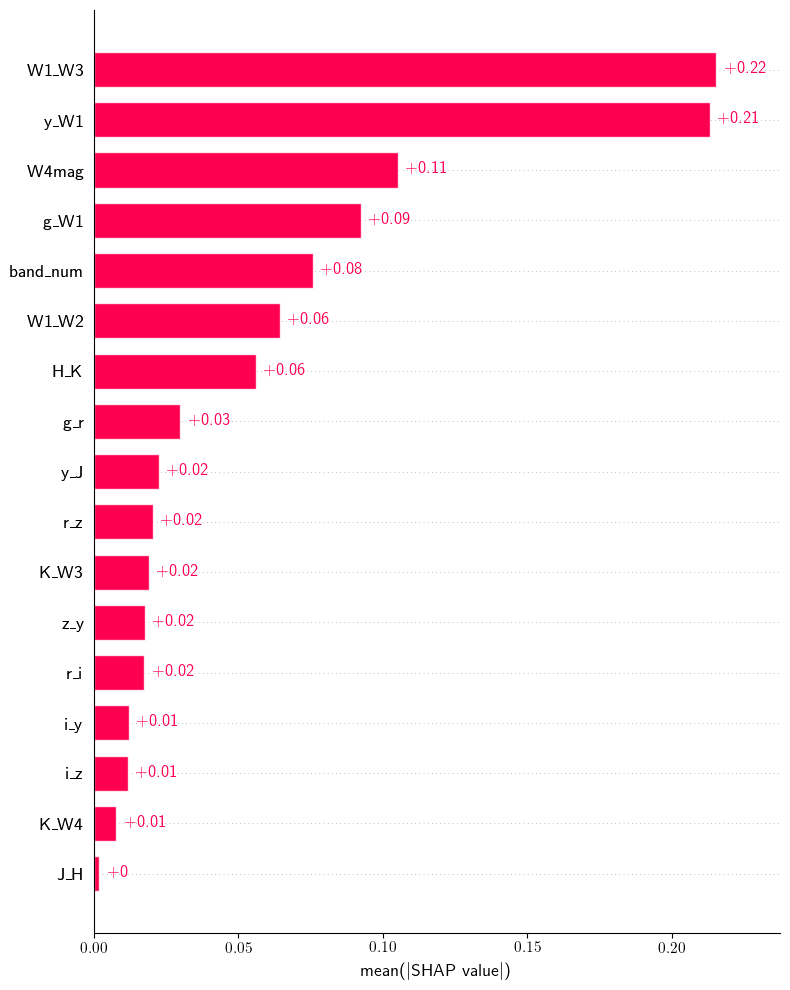

catboost


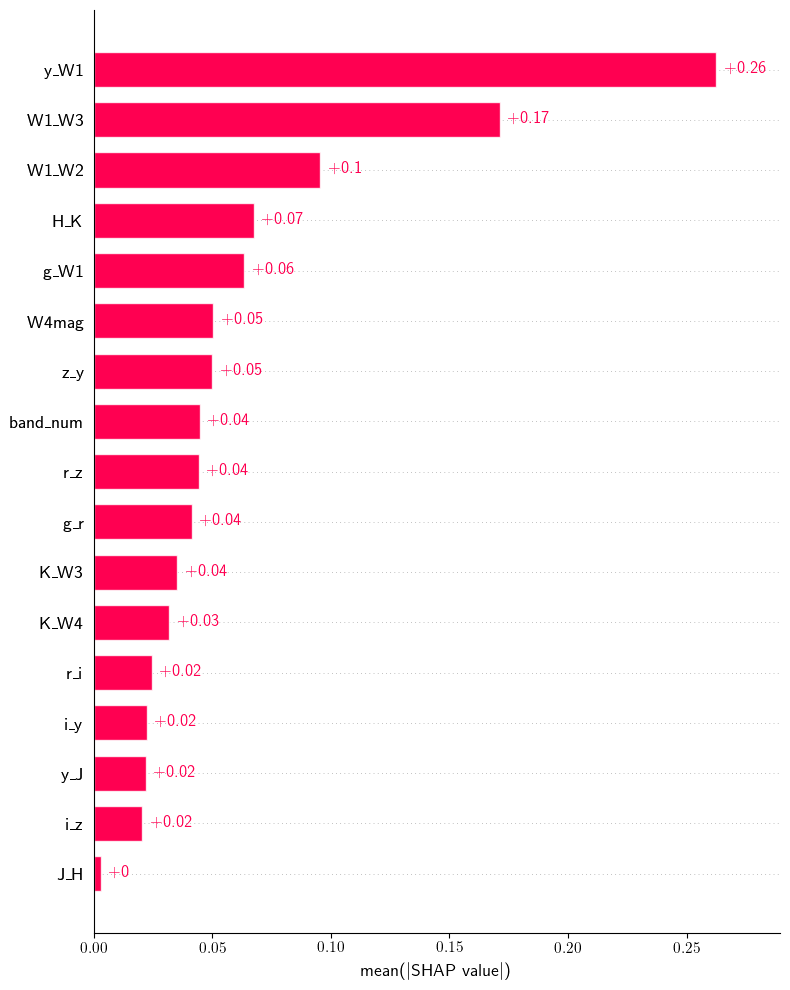

xgboost


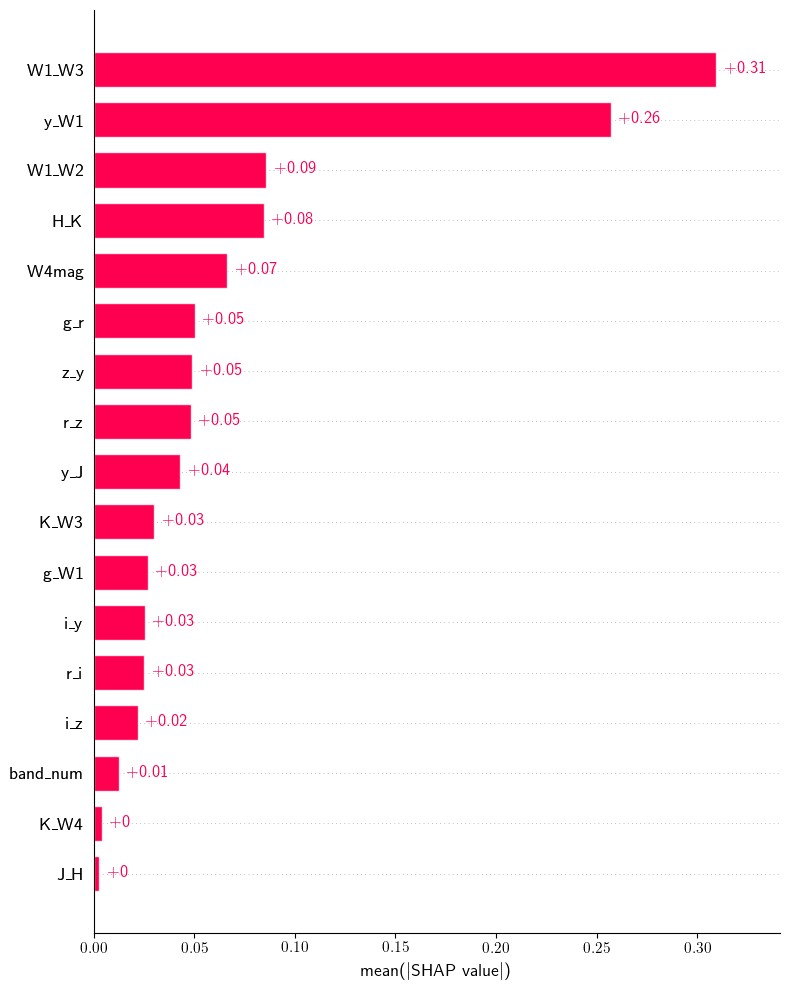

gbr


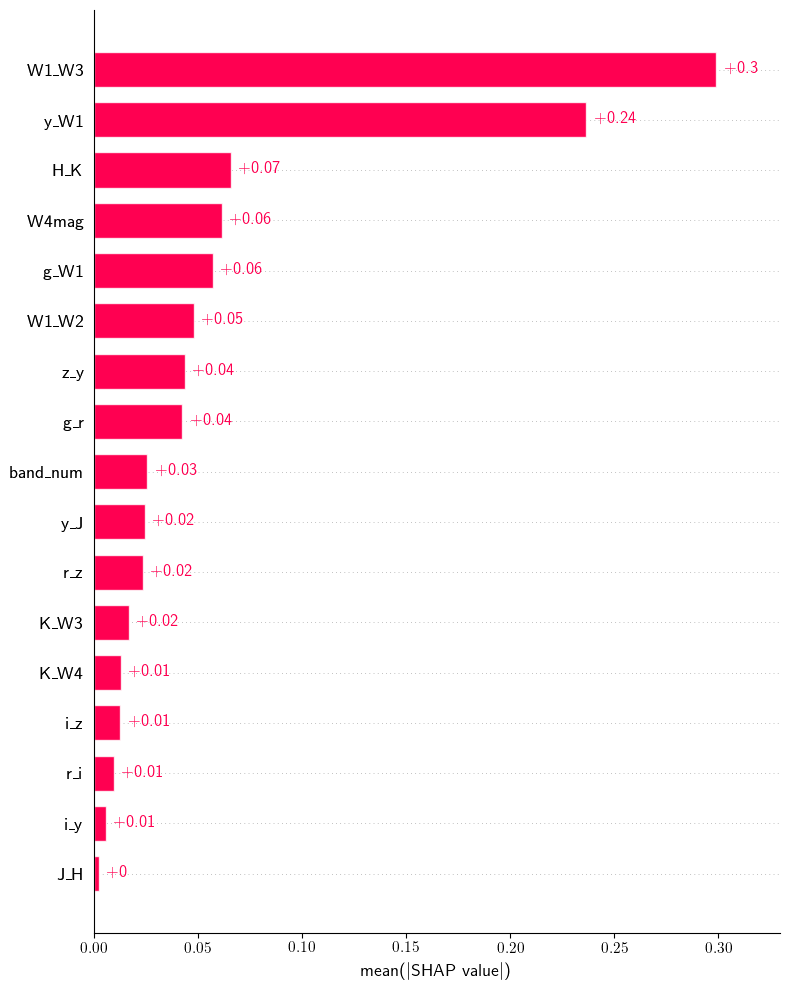

In [118]:
if run_shap_z_base:
    shp_copies_z_AGN = {}
    for model in shap_values_z_AGN_base.keys():
        # Convert from FastTreeShap to Shap object
        shp_copies_z_AGN[model] = shap.Explanation(values=shap_values_z_AGN_base[model].values,
                                                   base_values=shap_values_z_AGN_base[model].base_values,
                                                   data=shap_values_z_AGN_base[model].data,
                                                   feature_names=shap_values_z_AGN_base[model].feature_names)
        print(f'{model}')
        if np.ndim(shp_copies_z_AGN[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_z_AGN[model], max_display=None, show=False)
        elif np.ndim(shp_copies_z_AGN[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_z_AGN[model][:, :, 1], max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

In [119]:
if run_shap_z_base:
    for count, model in enumerate(shap_values_z_AGN_base.keys()):
        print(f'\n{model}:')
        # The model's raw prediction for the first observation.
        print(redshift_reg_rAGN.named_steps['trained_model'].estimators_[count].predict(reduced_data_z_AGN_df.drop(columns=base_models_name_z_AGN))[0].round(5))
    
        # The corresponding sum of the mean + shap values
        try:
            print((explainers_z_AGN_base[model].expected_value[-1] + shap_values_z_AGN_base[model].values[0].sum()).round(5))
        except:
            print((explainers_z_AGN_base[model].expected_value + shap_values_z_AGN_base[model].values[0].sum()).round(5))


et:
1.63704
1.63704

catboost:
1.71319
1.71319

xgboost:
1.96355
1.96355

gbr:
1.27414
1.27414


---

#### SHAP - Redshift prediction model for radio SFG

In [120]:
if run_shap_z_base:
    model_name_z_SFG = type(redshift_reg_rSFG.named_steps['trained_model'].final_estimator_).__name__.replace('Regressor', '')

SHAP does not need to use the full dataset for its analysis. Around $N=1000$ (or less) is a good number.

In [121]:
np.shape(data_radio_SFG)

(2005, 50)

In [122]:
if run_shap_z_base:
    sample_size_z_SFG        = 2500
    sample_size_z_SFG        = np.nanmin([sample_size_z_SFG, np.shape(data_radio_SFG)[0]])
    print(f'Number of selected elements: {sample_size_z_SFG:,}')

Number of selected elements: 2,005


In [123]:
if run_shap_z_base:
    base_models_name_z_SFG = gf.get_base_estimators_names(redshift_reg_rSFG)

In [124]:
if run_shap_z_base:
    reduced_data_z_SFG    = data_radio_SFG.sample(n=sample_size_z_SFG, random_state=gv.seed).copy()
    display(reduced_data_z_SFG.loc[:, ['Z', 'pred_Z_rSFG']].describe())
    reduced_data_z_SFG_df = gf.preprocess_data(redshift_reg_rSFG, reduced_data_z_SFG, base_models_name_z_SFG)
    reduced_cols_z_SFG    = reduced_data_z_SFG_df.columns.drop(base_models_name_z_SFG)

,Z,pred_Z_rSFG
count,2005.000000,2005.000000
mean,0.334220,0.336274
std,0.289564,0.247394
min,0.000000,0.021400
25%,0.106000,0.107200
50%,0.255050,0.277000
75%,0.532020,0.558500
max,4.680000,1.272300


Use FastTreeSHAP package

In [125]:
if run_shap_z_base:
    explainers_z_SFG_base           = {}
    for model, model_fit in zip(redshift_reg_rSFG.named_steps['trained_model'].estimators, redshift_reg_rSFG.named_steps['trained_model'].estimators_):
        explainers_z_SFG_base[model[0]] = fasttreeshap.TreeExplainer(model_fit, data=None, feature_perturbation='tree_path_dependent',
                                                                     model_output='raw', feature_dependence='independent',
                                                                     algorithm='auto', n_jobs=12)

In [126]:
if run_shap_z_base:
    shap_values_z_SFG_base = {}
    for model in explainers_z_SFG_base.keys():
        print(f'Working with base model {model}')
        shap_values_z_SFG_base[model] = explainers_z_SFG_base[model](reduced_data_z_SFG_df.drop(columns=base_models_name_z_SFG))

Working with base model rf
Working with base model catboost
Working with base model xgboost
Working with base model gbr


In [127]:
if run_shap_z_base:
    print('Expected "logit" values per base model')
    print('-' * 30)
    for model in explainers_z_SFG_base.keys():
        try:
            print(f'{model: <10}\t: {explainers_z_SFG_base[model].expected_value[-1]: .4f}')
        except:
            print(f'{model: <10}\t: {explainers_z_SFG_base[model].expected_value: .4f}')

Expected "logit" values per base model
------------------------------
rf        	:  0.4093
catboost  	:  0.4093
xgboost   	:  0.4093
gbr       	:  0.4093


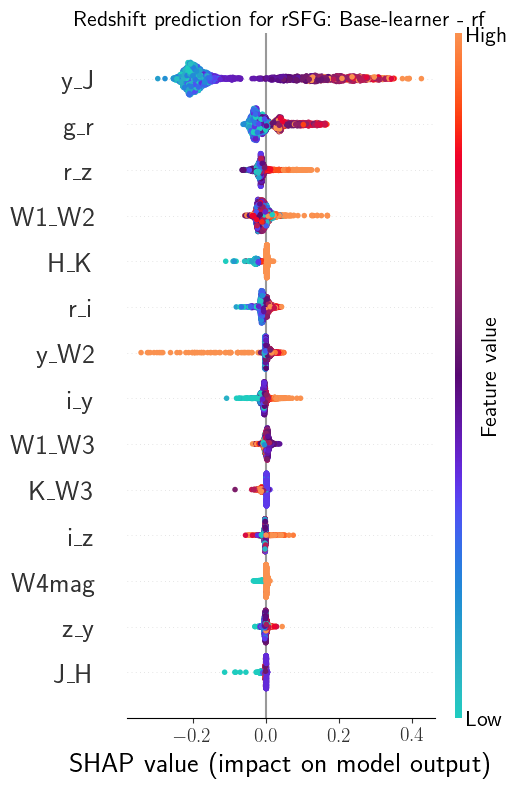

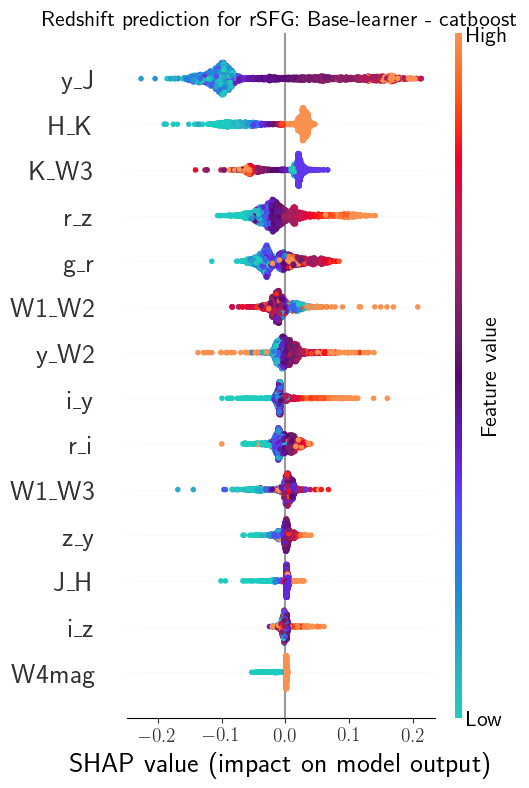

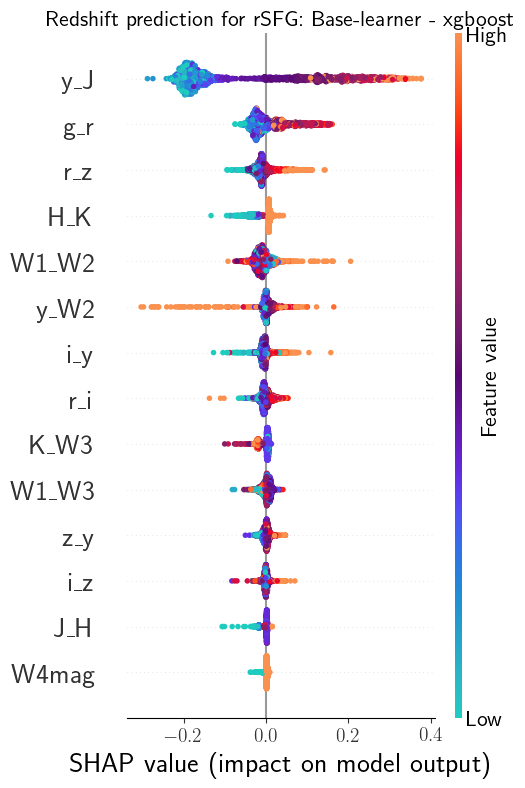

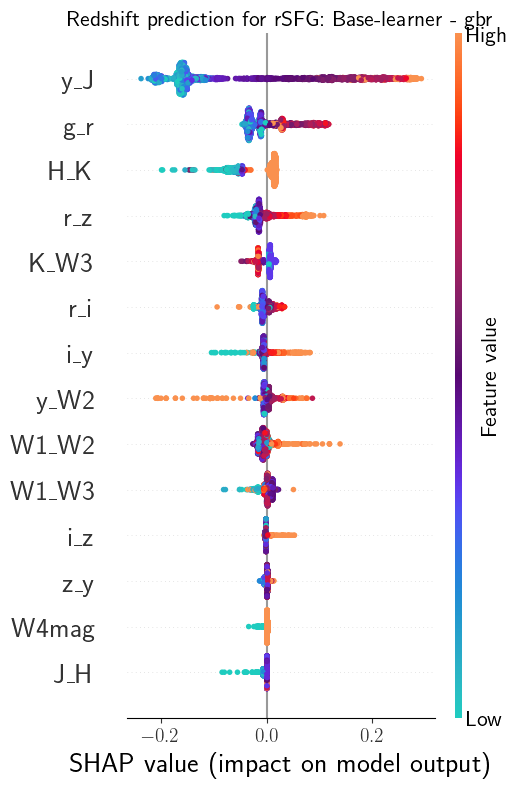

In [128]:
if run_shap_z_base:
    for model in shap_values_z_SFG_base.keys():
        gf.plot_shap_beeswarm('Redshift prediction for rSFG', model, shap_values_z_SFG_base[model], base_meta='Base')
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_z_SFG_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

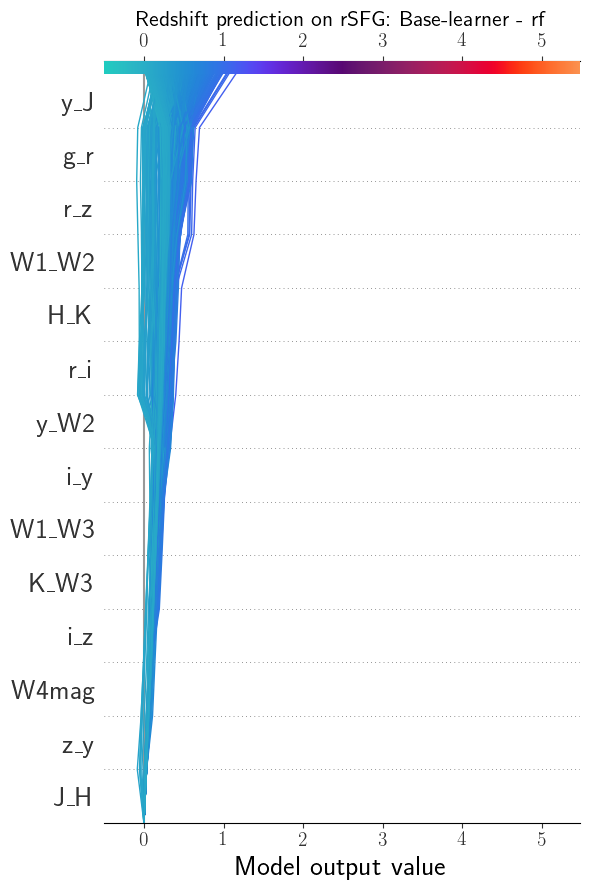

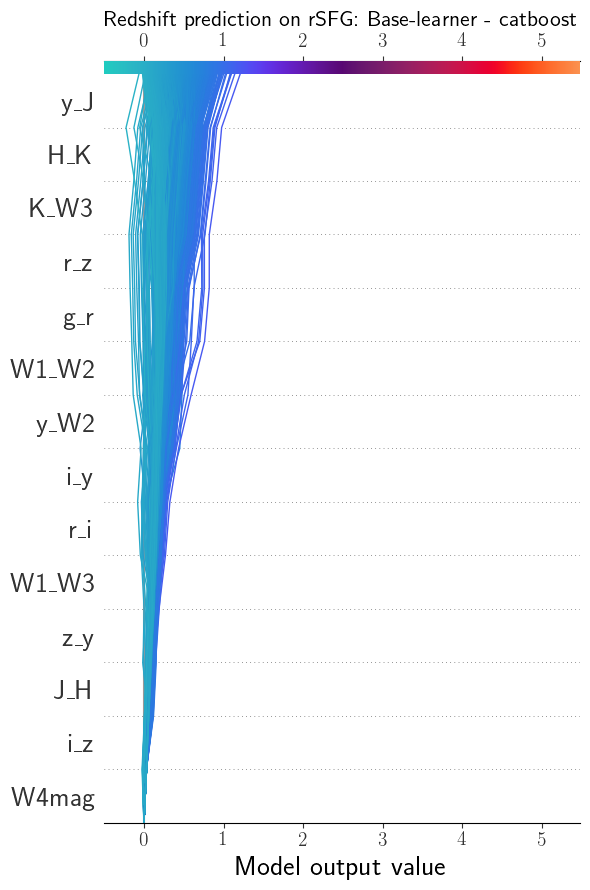

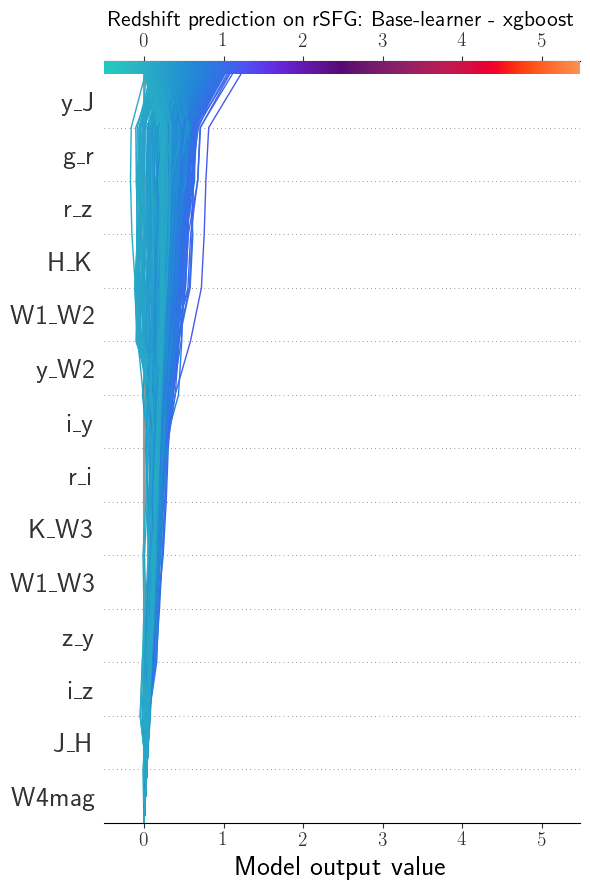

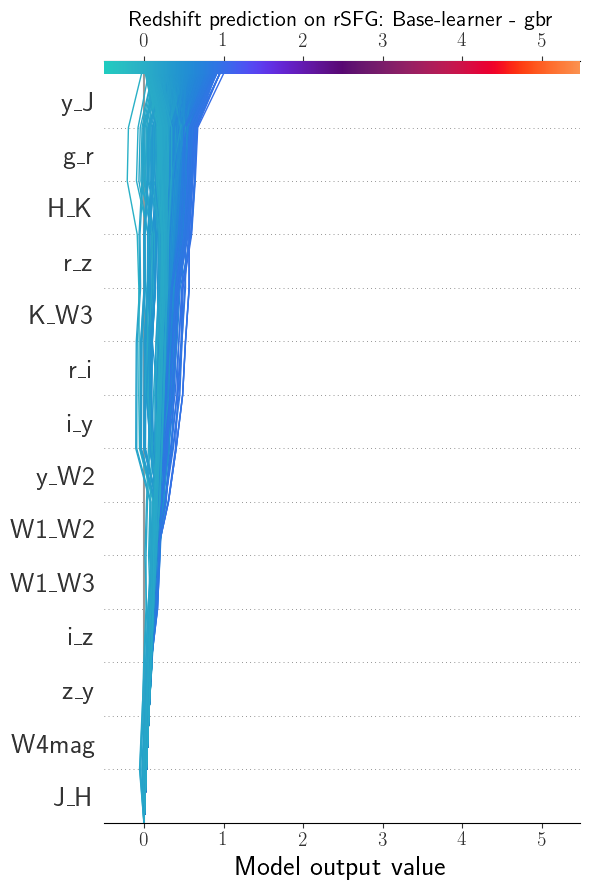

In [129]:
if run_shap_z_base:
    xlims_plt_z_SFG         = (-0.5, data_radio_SFG.loc[reduced_data_z_SFG_df.index, ['Z', 'pred_Z_rSFG']].max().max() + 0.8)
    for model in shap_values_z_SFG_base.keys():
        size_side       = 6
        fig             = plt.figure(figsize=(size_side, size_side * 3/2))
        ax1             = fig.add_subplot(111, xscale='linear', yscale='linear')
        _ = gf.plot_shap_decision('Redshift prediction on rSFG', model, shap_values_z_SFG_base[model],
                                  explainers_z_SFG_base[model], reduced_cols_z_SFG, ax1, 'identity',
                                  new_base_value=0.0, base_meta='Base', xlim=xlims_plt_z_SFG,
                                  ignore_warnings=True)
        if save_plot_flag:
            plt.savefig(gv.plots_path + f'SHAP_decision_z_SFG_base_{model}_{used_area}{subset_str}{high_z_str}.pdf', bbox_inches='tight')
        plt.show()

In [130]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_SFG = gf.mean_abs_SHAP_base_models(shap_values_z_SFG_base, list(shap_values_z_SFG_base.keys()))
    for key in shap_values_z_SFG_base.keys():
        sorted_mean_abs_SHAP_z_SFG[key].loc[:, 'Mean_abs_SHAP'] = sorted_mean_abs_SHAP_z_SFG[key].loc[:, 'Mean_abs_SHAP'] /\
                                                              sorted_mean_abs_SHAP_z_SFG[key].loc[:, 'Mean_abs_SHAP'].sum() * 100
    multicol_feat_z_SFG = [(key, name) for key in sorted_mean_abs_SHAP_z_SFG.keys() for name in ('Feature', 'Mean_abs_SHAP')]

In [131]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_SFG_base_full_df = pd.concat([sorted_mean_abs_SHAP_z_SFG[key].reset_index(drop=True) for key in shap_values_z_SFG_base.keys()],
                                                        axis=1)
    sorted_mean_abs_SHAP_z_SFG_base_full_df.columns = pd.MultiIndex.from_tuples(multicol_feat_z_SFG)
    print('Mean absolute SHAP values scaled to sum 100')
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_z_SFG_base_full_df)

Mean absolute SHAP values scaled to sum 100


rf               catboost               xgboost                   gbr  \
   Feature Mean_abs_SHAP  Feature Mean_abs_SHAP Feature Mean_abs_SHAP Feature   
0      y_J        56.383      y_J        30.453     y_J        51.659     y_J   
1      g_r        11.631      H_K        14.174     g_r        10.611     g_r   
2      r_z         6.239     K_W3         9.838     r_z         6.081     H_K   
3    W1_W2         4.735      r_z         9.592     H_K         5.524     r_z   
4      H_K         3.975      g_r         8.250   W1_W2         5.212    K_W3   
5      r_i         3.387    W1_W2         4.987    y_W2         4.049     r_i   
6     y_W2         3.116     y_W2         4.615     i_y         3.217     i_y   
7      i_y         2.928      i_y         4.525     r_i         3.051    y_W2   
8    W1_W3         1.656      r_i         4.018    K_W3         2.833   W1_W2   
9     K_W3         1.567    W1_W3         3.516   W1_W3         2.371   W1_W3   
10     i_z         1.391      z_y         2.100     z_y         1.729     i_z   
11   W4mag         1.108      J_H         1.645     i_z         1.494     z_y   
12     z_y         1.057      i_z         1.280     J_H         1.311   W4mag   
13     J_H         0.828    W4mag         1.007   W4mag         0.859     J_H   

                  
   Mean_abs_SHAP  
0         50.258  
1         11.367  
2         10.921  
3          6.750  
4          3.401  
5          3.369  
6          3.261  
7          2.957  
8          2.934  
9          2.201  
10         0.723  
11         0.714  
12         0.612  
13         0.531

In [132]:
if run_shap_z_base:
    sorted_mean_abs_SHAP_z_SFG = pd.read_hdf(gv.tmp_shap_path + f'mean_abs_SHAP_z_SFG_meta_{used_area}{subset_str}{high_z_str}.h5', key='df')

In [133]:
if run_shap_z_base:
    print('Combined mean absolute SHAP values scaled to sum 100')
    sorted_mean_abs_SHAP_z_SFG_comb = sorted_mean_abs_SHAP_z_SFG.copy().set_index('Feature')
    for key in shap_values_z_SFG_base.keys():
        factor = sorted_mean_abs_SHAP_z_SFG.set_index('Feature').loc[key] / 100
        tmp_feat_imp = sorted_mean_abs_SHAP_z_SFG_base_full_df.loc[:, key].copy().set_index('Feature')
        sorted_mean_abs_SHAP_z_SFG_comb = sorted_mean_abs_SHAP_z_SFG_comb + tmp_feat_imp * factor
    sorted_mean_abs_SHAP_z_SFG_comb = sorted_mean_abs_SHAP_z_SFG_comb.sort_values(by=['Mean_abs_SHAP'],
                                                                              ascending=False).drop(index=list(shap_values_z_SFG_base.keys()))
    sorted_mean_abs_SHAP_z_SFG_comb['Cumulative_sum'] = sorted_mean_abs_SHAP_z_SFG_comb.loc[:, 'Mean_abs_SHAP'].cumsum()
    with pd.option_context('display.float_format', '{:.3f}'.format):
        display(sorted_mean_abs_SHAP_z_SFG_comb)

Combined mean absolute SHAP values scaled to sum 100


,Mean_abs_SHAP,Cumulative_sum
Feature,,
y_J,43.865,43.865
H_K,9.751,53.616
g_r,9.703,63.319
r_z,7.259,70.578
W1_W2,5.185,75.764
K_W3,4.791,80.554
y_W2,3.781,84.336
r_i,3.758,88.094
i_y,3.640,91.734


rf


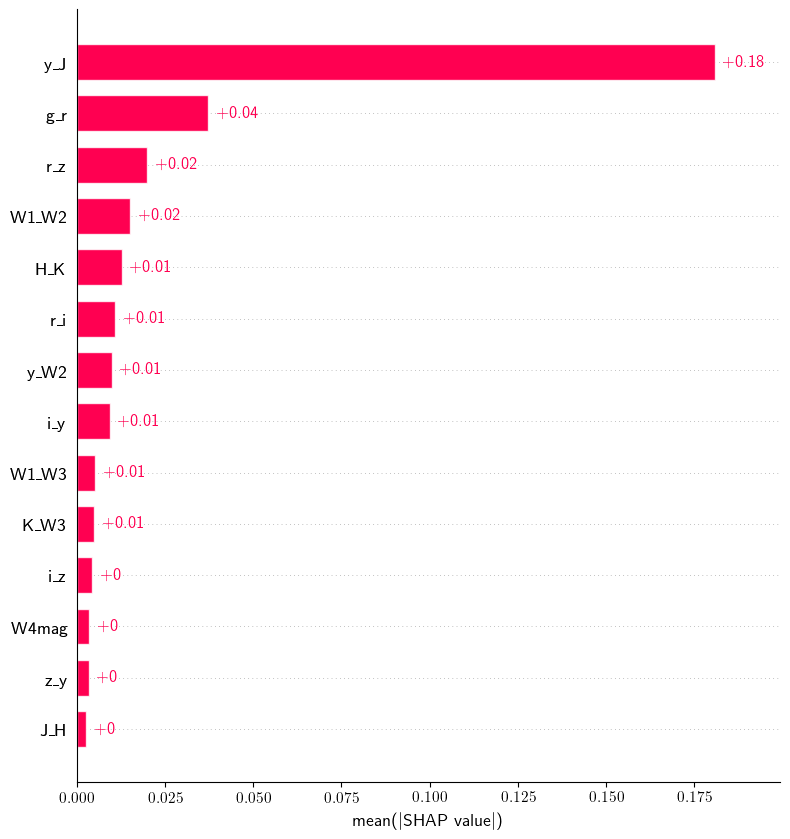

catboost


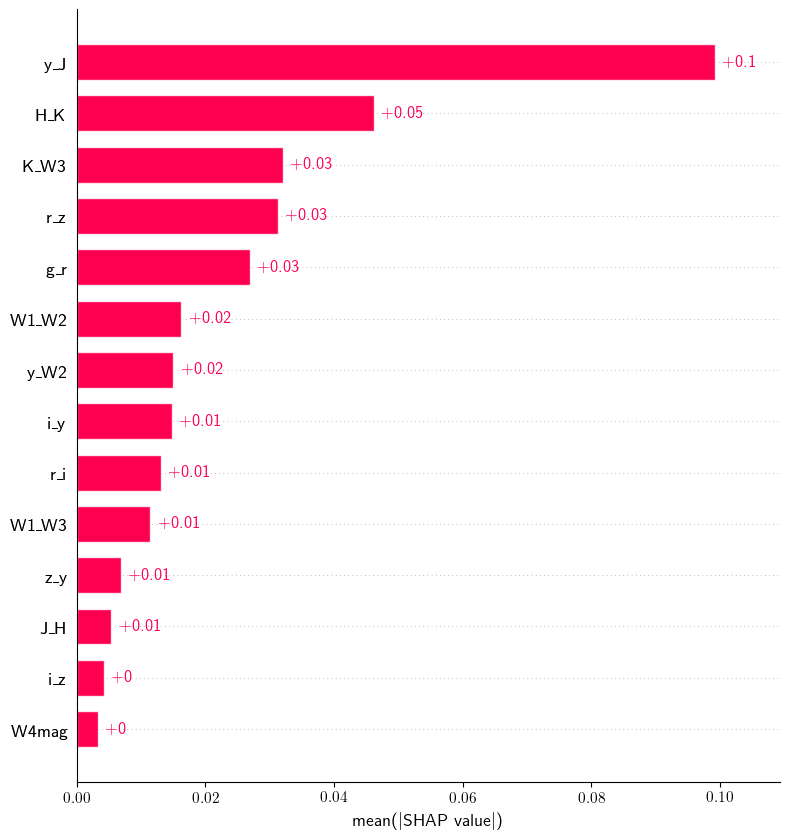

xgboost


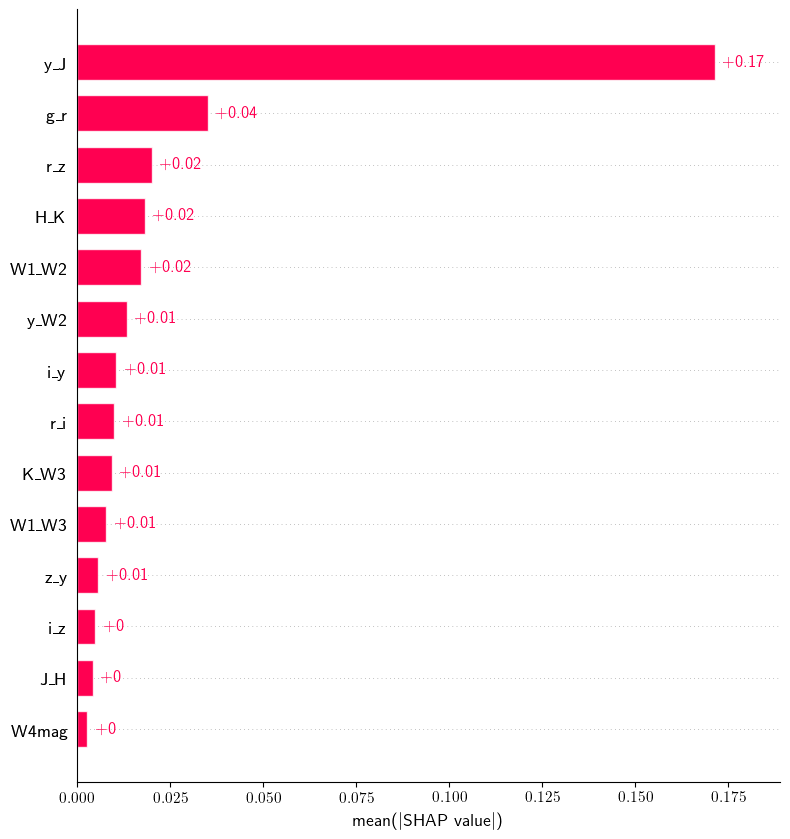

In [ ]:
if run_shap_z_base:
    shp_copies_z_SFG = {}
    for model in shap_values_z_SFG_base.keys():
        # Convert from FastTreeShap to Shap object
        shp_copies_z_SFG[model] = shap.Explanation(values=shap_values_z_SFG_base[model].values,
                                                   base_values=shap_values_z_SFG_base[model].base_values,
                                                   data=shap_values_z_SFG_base[model].data,
                                                   feature_names=shap_values_z_SFG_base[model].feature_names)
        print(f'{model}')
        if np.ndim(shp_copies_z_SFG[model].values) == 2:
            shap.plots.bar(shap_values=shp_copies_z_SFG[model], max_display=None, show=False)
        elif np.ndim(shp_copies_z_SFG[model].values) > 2:
            shap.plots.bar(shap_values=shp_copies_z_SFG[model][:, :, 1], max_display=None, show=False)
        plt.gca().set_xlabel('mean($\\vert$SHAP value$\\vert$)')
        plt.tight_layout()
        plt.show()

In [ ]:
if run_shap_z_base:
    for count, model in enumerate(shap_values_z_SFG_base.keys()):
        print(f'\n{model}:')
        # The model's raw prediction for the first observation.
        print(redshift_reg_rSFG.named_steps['trained_model'].estimators_[count].predict(reduced_data_z_SFG_df.drop(columns=base_models_name_z_SFG))[0].round(5))
    
        # The corresponding sum of the mean + shap values
        try:
            print((explainers_z_SFG_base[model].expected_value[-1] + shap_values_z_SFG_base[model].values[0].sum()).round(5))
        except:
            print((explainers_z_SFG_base[model].expected_value + shap_values_z_SFG_base[model].values[0].sum()).round(5))

---